In [1]:
%load_ext autoreload
%autoreload 2

# XTCAV Power Profile Reconstruction

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# XTCAV classes
from xtcav_dark_reference import XTCAVDarkReference
from xtcav_lasing_off import XTCAVLasingOffReference
from xtcav_lasing_on import XTCAVLasingOnReconstruction

# Data access
import psana
get_datasource = lambda runnum: psana.DataSource(f"exp=cxil1037623:run={runnum}:idx")

# Setup

In [3]:
# Set Parameters

# ---------------
# Run Numbers 
# ---------------
runnum_dark = 152
runnum_lasingoff = 153
runnum_lasingon = 156

# ---------------
# Analysis Params
# ---------------
fov = 180,320                            # Camera zoom-in box size & edge filter cutoff
max_shots_darkref = 100                  # Dark reference frames to average
shotsPerGroup_lasingOff_profiles = 100   # Shots in each lasing-off reference profile
n_pulses = 2                             # The number of pulses per shot

# Dark Reference

Setting up data run times...
Done.


XTCAV:0: UserWarning: No XTCAV Calibration for epics variable XTCAV_Beam_energy_dump_GeV
/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:171: UserWarning: Failed to find all global calibrations!
  warnings.warn('Failed to find all global calibrations!')


Setting data source types...:   0%|          | 0/3279 [00:00<?, ?it/s]

Data source types successfully set.
Electron beam source type is <class 'psana.Bld.BldDataEBeamV7'>
Gas detector source type is <class 'psana.Bld.BldDataFEEGasDetEnergyV1'>


Calculating dark background reference:   0%|          | 0/100 [00:00<?, ?it/s]


Maximum number of images processed



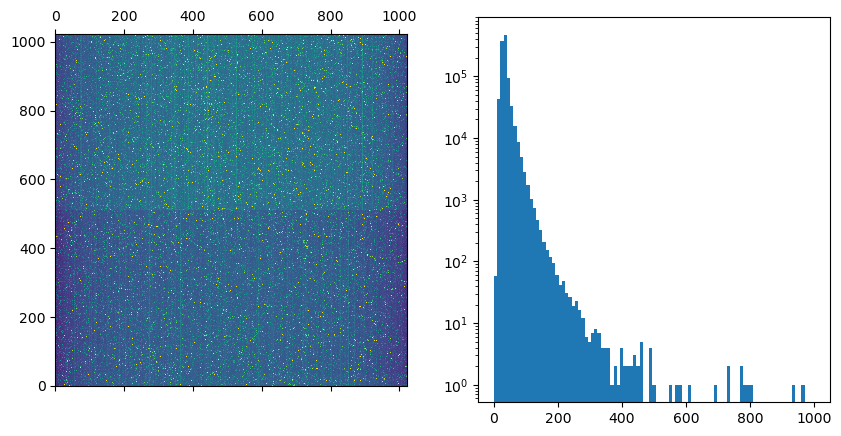

In [4]:
# Create object
xtdr = XTCAVDarkReference(
    get_datasource(runnum_dark),
    max_shots = max_shots_darkref,
)

# Show
xtdr.show(
    vrange = (0,1e2),
    bins = np.linspace(0,1000,100)
)

# Lasing-off reference

Setting up data run times...
Done.


XTCAV:0: UserWarning: No XTCAV Calibration for epics variable XTCAV_Beam_energy_dump_GeV


Setting data source types...:   0%|          | 0/5246 [00:00<?, ?it/s]

Data source types successfully set.
Electron beam source type is <class 'psana.Bld.BldDataEBeamV7'>
Gas detector source type is <class 'psana.Bld.BldDataFEEGasDetEnergyV1'>


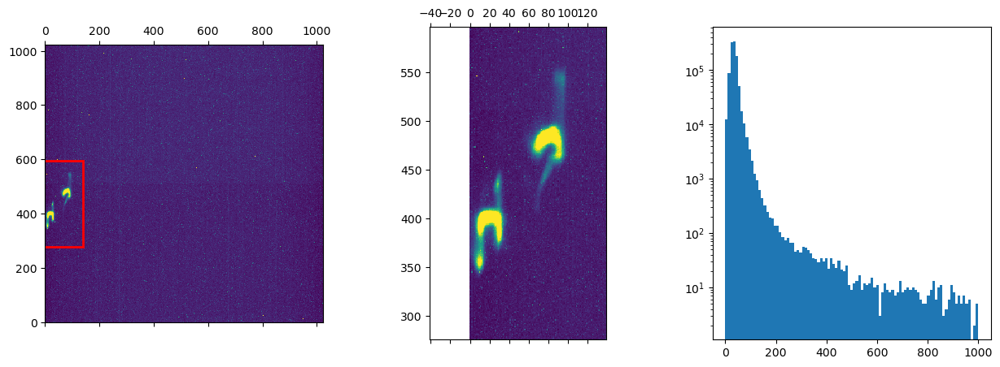

In [5]:
# Create object
xtoff = XTCAVLasingOffReference(
    get_datasource(runnum_lasingoff),
    shots_per_group = shotsPerGroup_lasingOff_profiles,
    fov = fov,
    dark_reference = xtdr,
    n_pulses = n_pulses,
)

# Examine the first event
i,j,evt = next(xtoff.shot_iterator)
xtoff.set_current_event(evt)
xtoff.show_current_frame(
    vrange=(0,350),
    bins=np.linspace(0,1000,100),
)

Looping through the next 3 'ok' events...
Showing 'ok' shot #2 at time index 155:


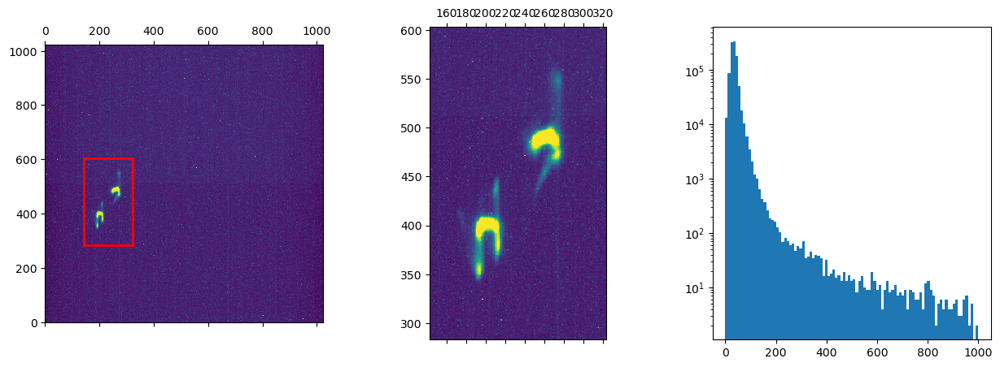

Showing 'ok' shot #3 at time index 156:


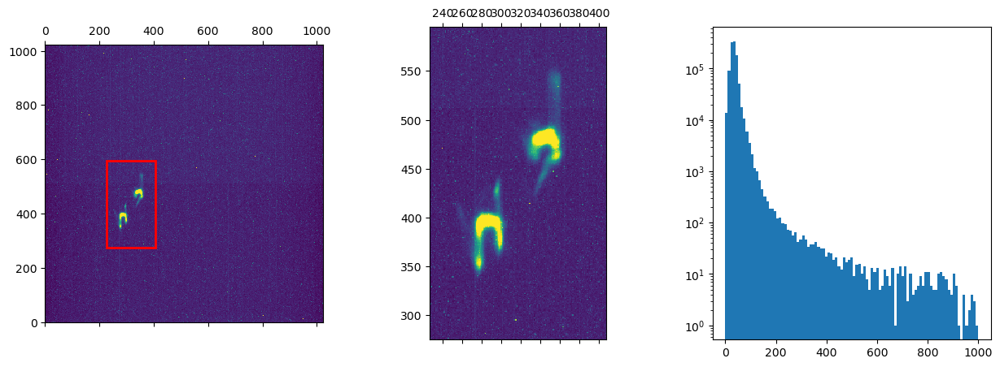

Showing 'ok' shot #4 at time index 157:


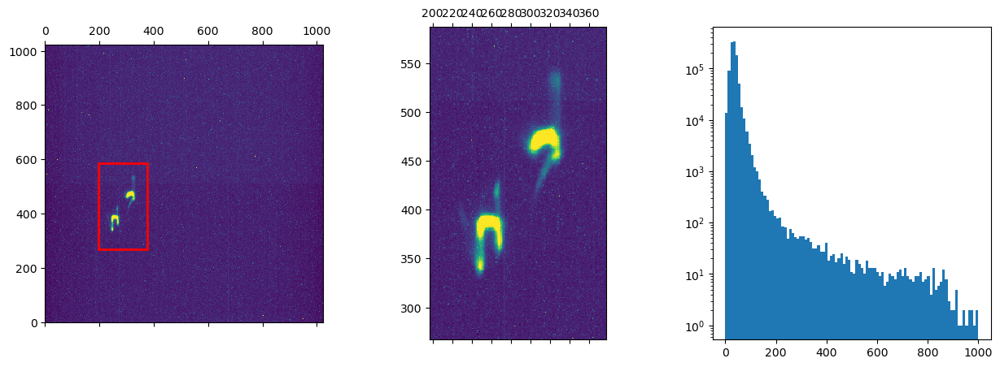

In [6]:
# Examine a few more events

n_shots_show = 3

print(f"Looping through the next {n_shots_show} 'ok' events...")
for idx,(i,j,evt) in enumerate(xtoff.shot_iterator):
    print(f"Showing 'ok' shot #{i+1} at time index {j}:")

    # Get & show event
    xtoff.set_current_event(evt)
    xtoff.show_current_frame()

    # continue?
    if idx>=n_shots_show-1:
        break

Looping through the first 3 'ok' events...
Showing 'ok' shot #1 at time index 154:


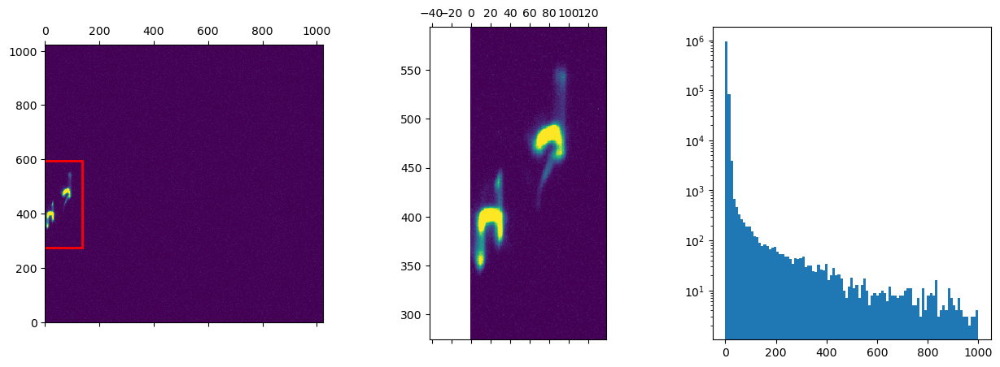

Showing 'ok' shot #2 at time index 155:


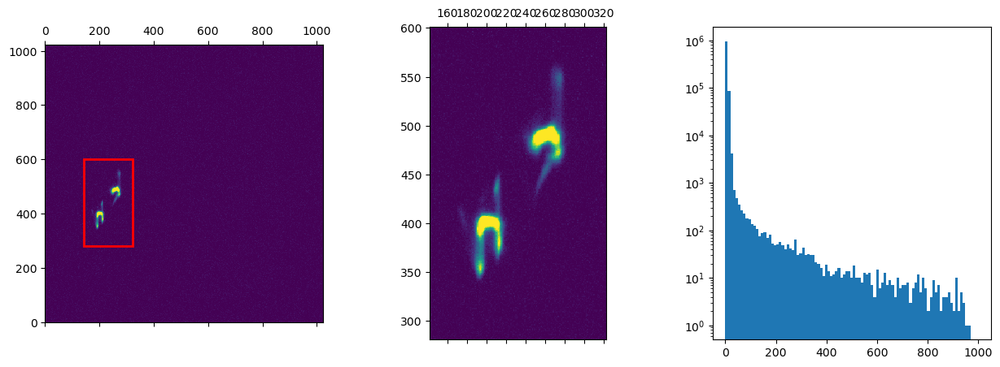

Showing 'ok' shot #3 at time index 156:


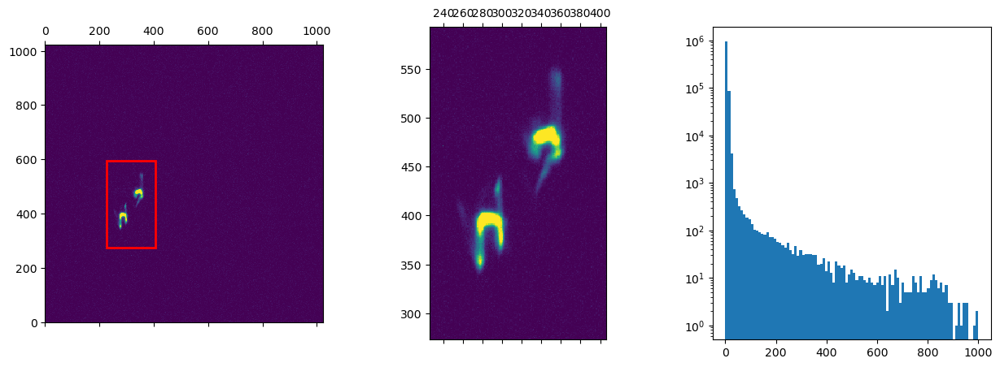

In [7]:
# Background subtraction

# # Set dark ref
# xtoff.set_darkreference(xtdr)

# Examine dark ref subtracted data
xtoff.reset_shot_iterator()
n_shots_show = 3
print(f"Looping through the first {n_shots_show} 'ok' events...")
for idx,(i,j,evt) in enumerate(xtoff.shot_iterator):
    print(f"Showing 'ok' shot #{i+1} at time index {j}:")

    # Get & show event
    xtoff.set_current_event(evt)
    xtoff.show_current_frame(preprocess='bksb')

    # continue?
    if idx>=n_shots_show-1:
        break

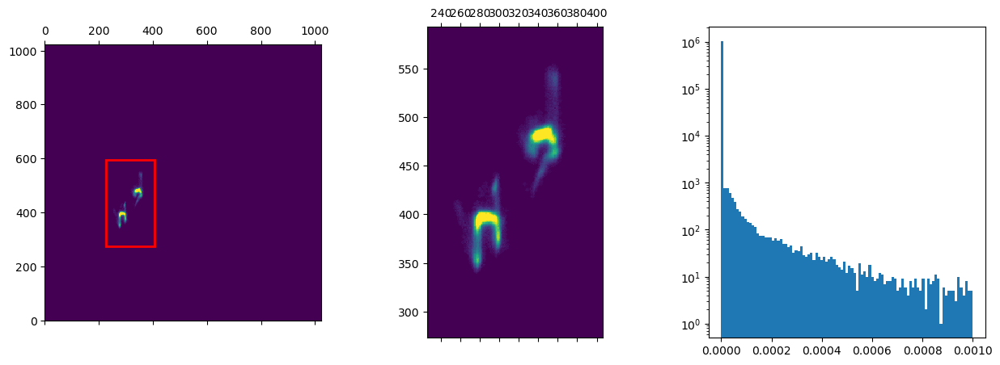

In [8]:
# Denoise

xtoff.show_frame(
    frame = xtoff.get_frame_denoised_current(
        nstd=1,                              # auto updates default params
        close=2
    ),
    vrange=(0,6e-4),                         # update intensity display range;
    bins=np.linspace(0,1e-3,100),            # denoising also normalizes total image intensity to 1
)

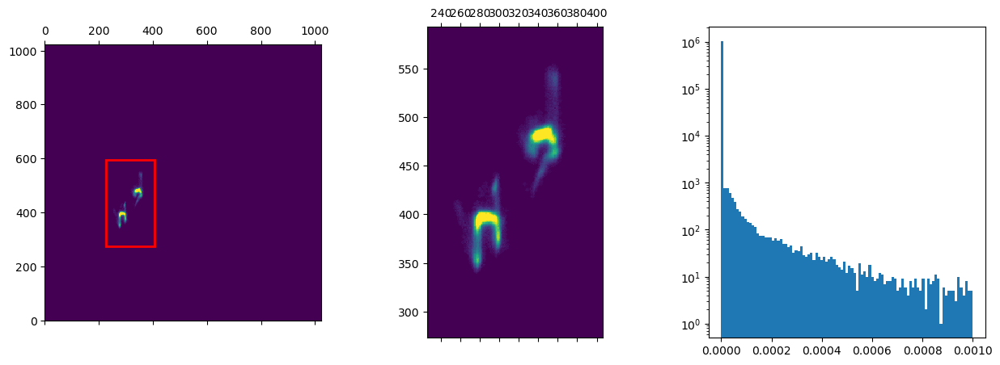

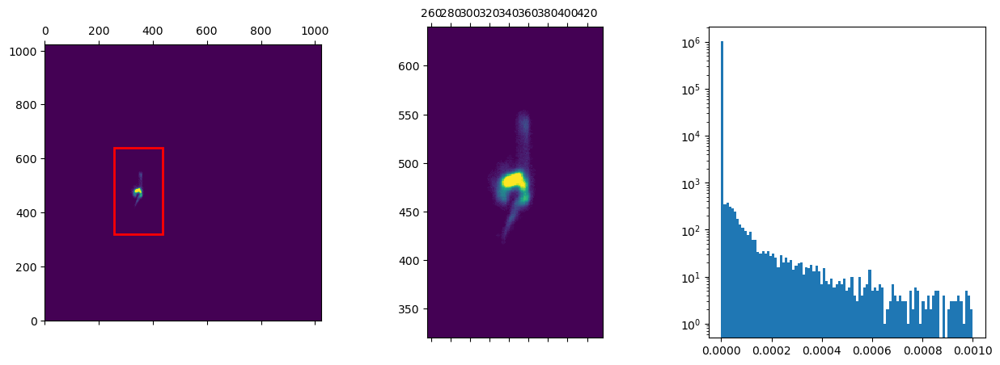

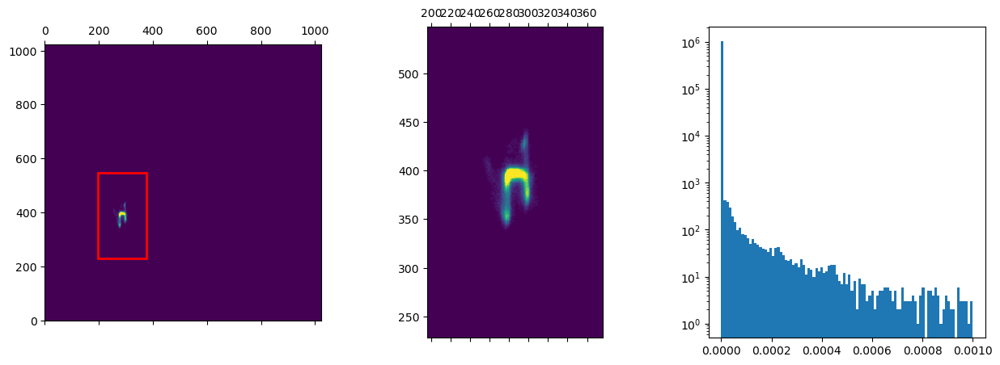

In [9]:
# Split images

# Get a denoised frame & split its pulses
im = xtoff.get_frame_denoised_current()
ims,ok = xtoff.split_frame(im)
assert(ok), "Failed to split image frame"

# Show
for image in (im,ims[0],ims[1]):   # Original image, pulse 1, and pulse 2
    xtoff.show_frame(image)

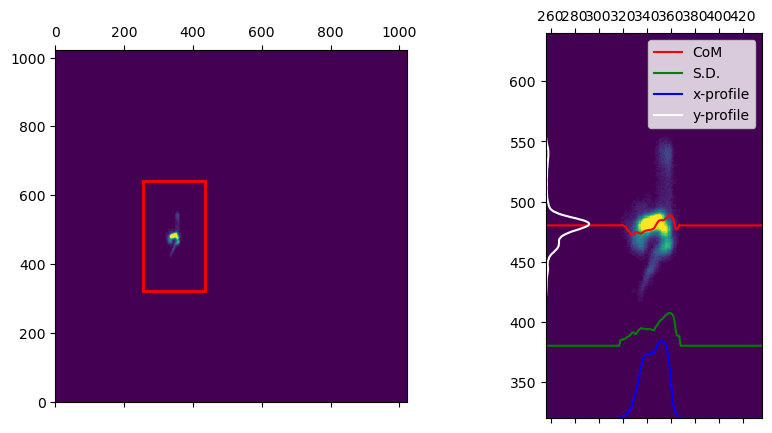

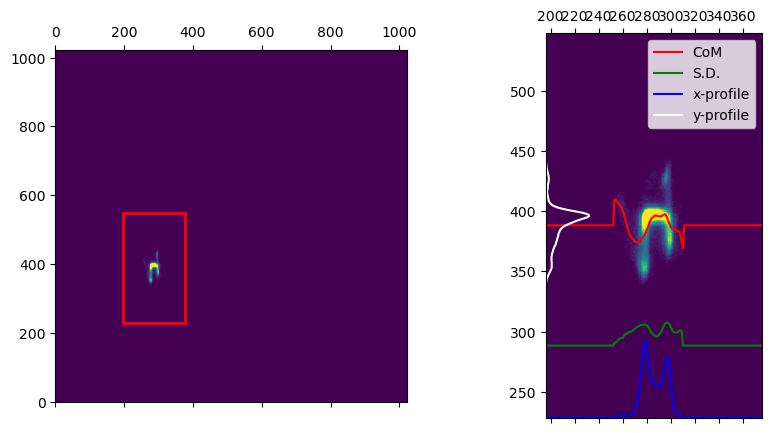

In [10]:
# Get image statistics

frame1,frame2 = ims[0],ims[1]
imageStats1 = xtoff.get_pulse_statistics(frame1)
imageStats2 = xtoff.get_pulse_statistics(frame2)

# Show
xtoff.show_frame_statistics(
    frame1,
    imageStats1,
)
xtoff.show_frame_statistics(
    frame2,
    imageStats2,
)

## Get full lasing-off data run image statistics

In [11]:
xtoff.get_shot_by_shot_statistics()

Calculating shot-by-shot statistics...:   0%|          | 0/5246 [00:00<?, ?it/s]

/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1380: UserWarning: Hardcoded calibrations are not yet calculated - returning uncalibrated axes!
  warnings.warn("Hardcoded calibrations are not yet calculated - returning uncalibrated axes!")
/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1526: RuntimeWarning: invalid value encountered in scalar divide
  x = np.sum(xx*ar)/m
/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1527: RuntimeWarning: invalid value encountered in scalar divide
  y = np.sum(yy*ar)/m
/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1052: RuntimeWarning: invalid value encountered in divide
  ans /= np.sum(ans)


All 5246 shots have been traversed.
Resetting the shot iterator.
Done. Calculated statistics for 4635 'good' shots.
Setting shot iterator to traverse good shots only.


-------------------------------
Showing usable shot #1:
-------------------------------


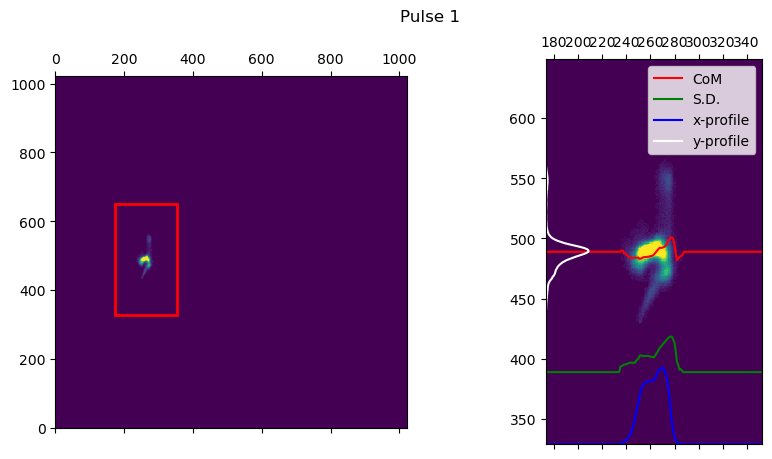

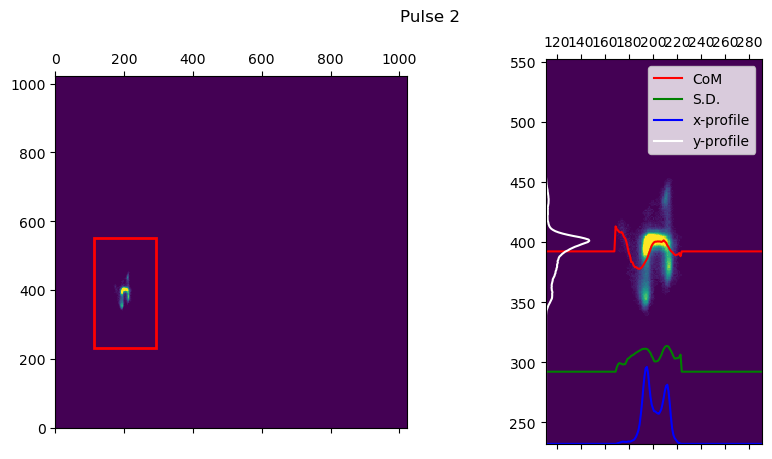

-------------------------------
Showing usable shot #1001:
-------------------------------


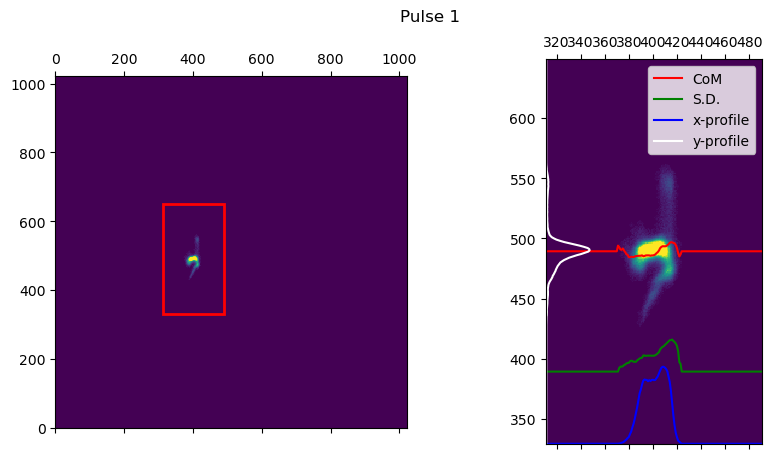

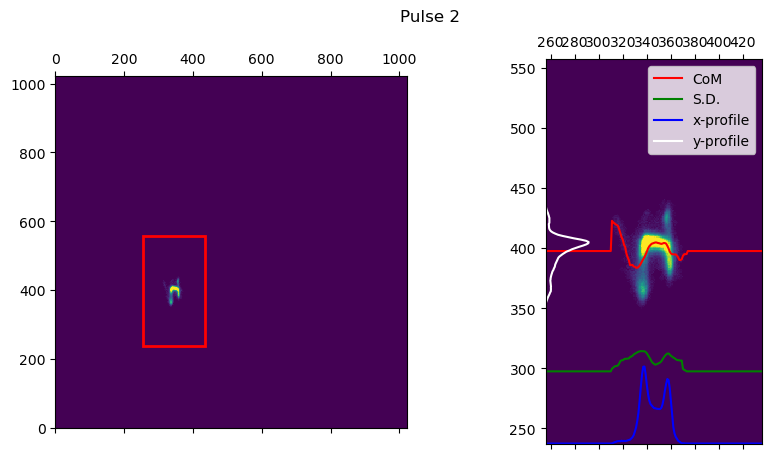

-------------------------------
Showing usable shot #2001:
-------------------------------


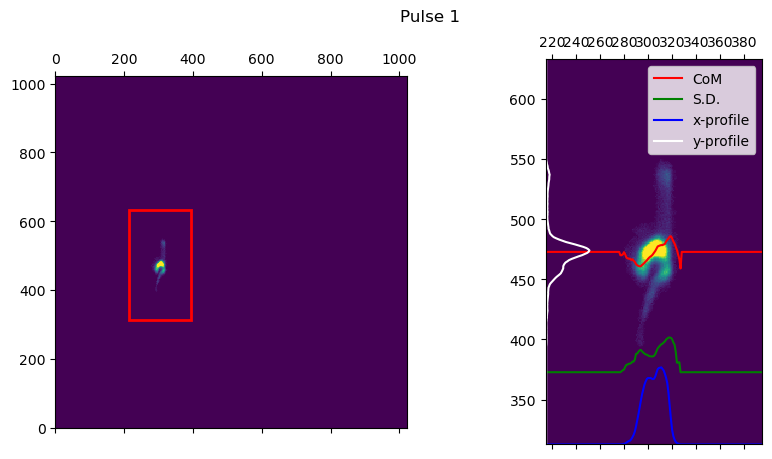

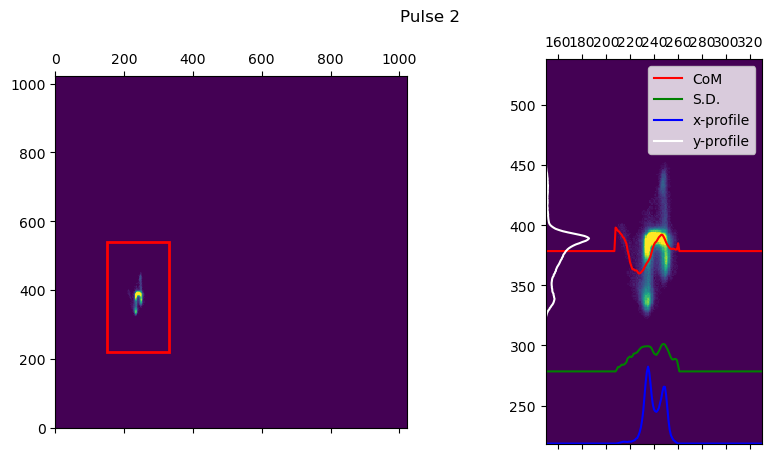

-------------------------------
Showing usable shot #3001:
-------------------------------


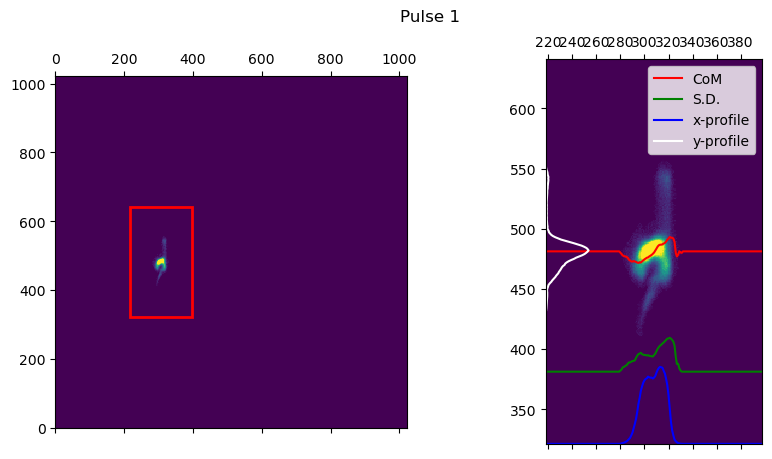

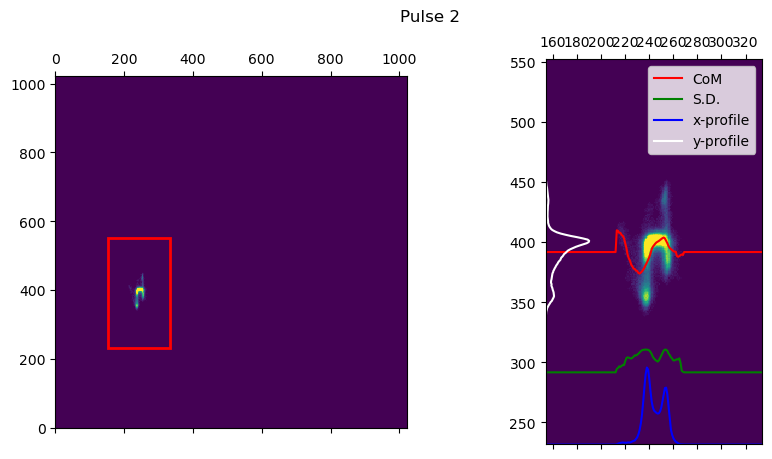

-------------------------------
Showing usable shot #4001:
-------------------------------


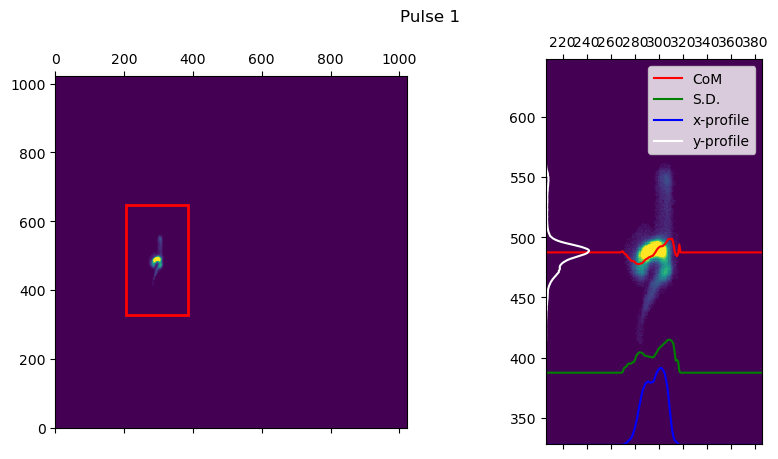

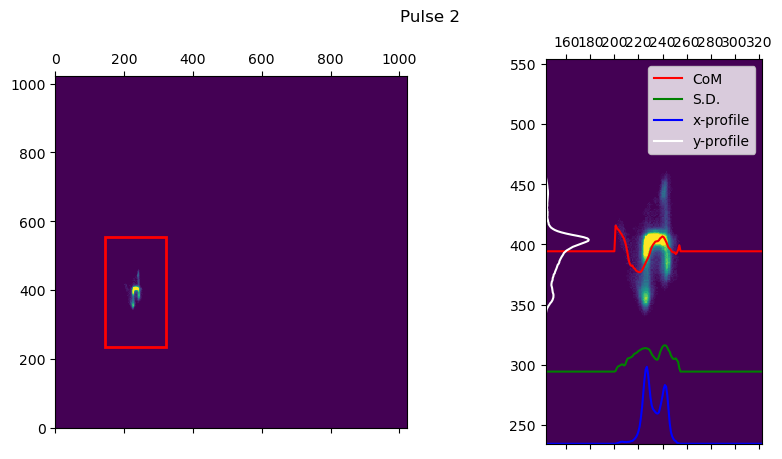

In [12]:
# Show a few shots & their pulse statistics

for i in [0,1000,2000,3000,4000]:       # select a few shots
    print("-------------------------------")
    print(f"Showing usable shot #{i+1}:")
    print("-------------------------------")
    xtoff.show_pulse_statistics( i )

## Get lasing-off average profiles

In [13]:
# Get lasing-off reference profiles

xtoff.calculate_reference_profiles()

Looping through the 2 pulses:   0%|          | 0/2 [00:00<?, ?it/s]

Interpolating XTCAV profiles:   0%|          | 0/4635 [00:00<?, ?it/s]

Forming 46 groups & calculating averages:   0%|          | 0/46 [00:00<?, ?it/s]

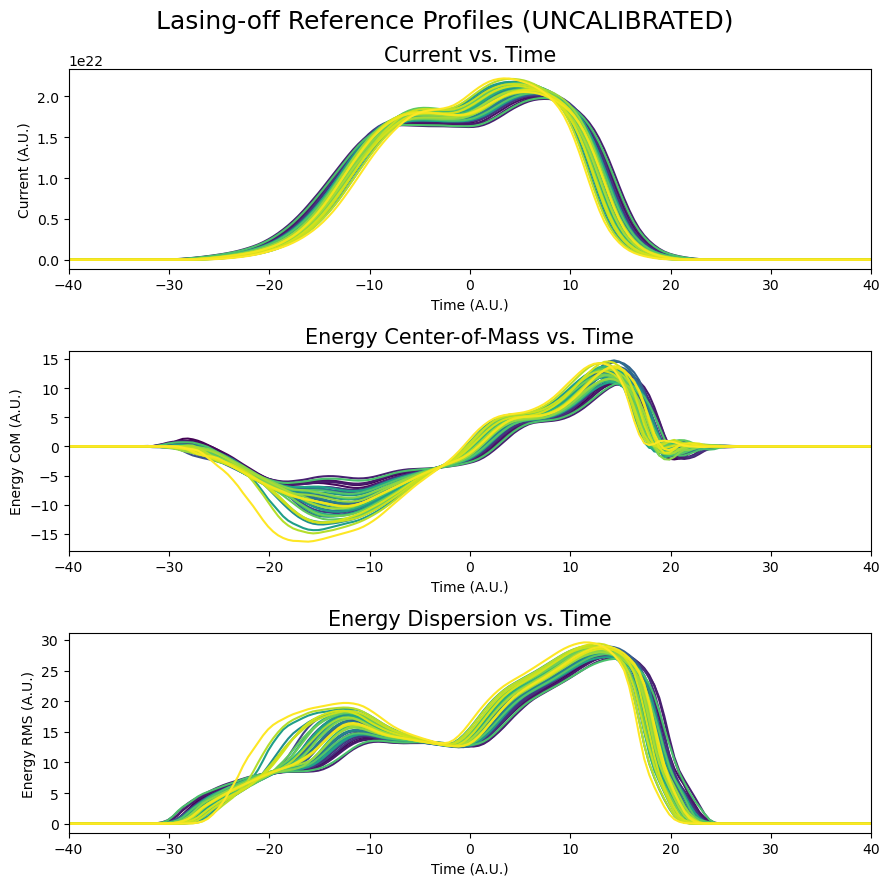

In [14]:
# Show reference profiles: 1'st pulse

xtoff.show_reference_profiles(
    idx_pulse=0,
    lims=[-40,40]
)

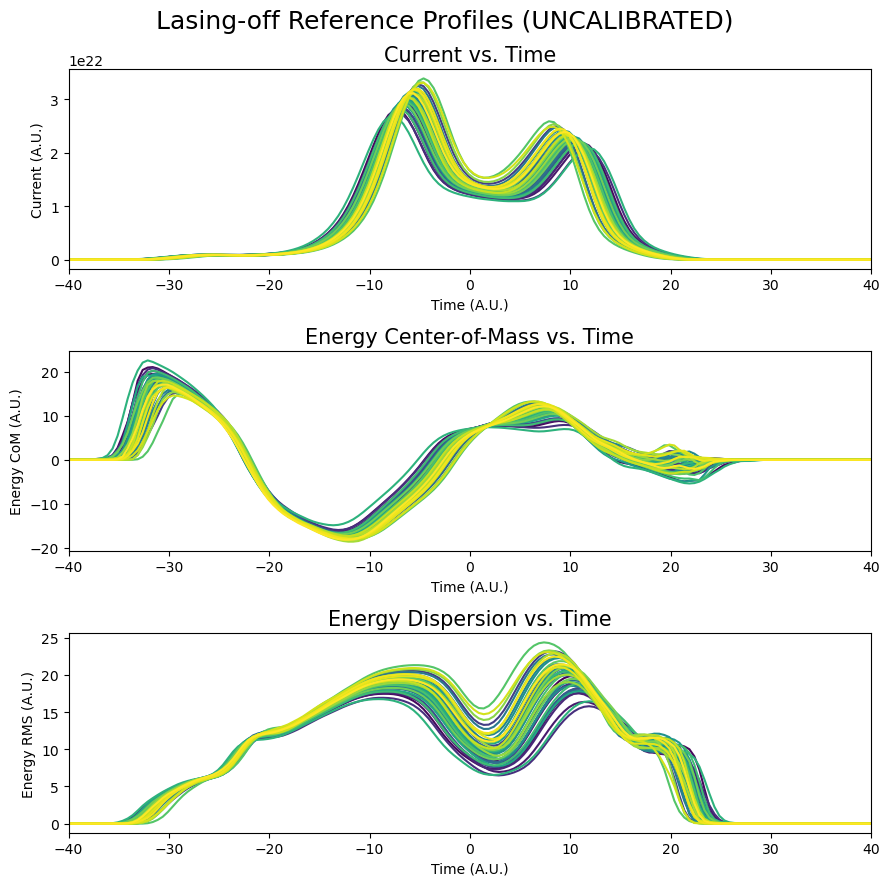

In [15]:
# Show reference profiles: 2'nd pulse

xtoff.show_reference_profiles(
    idx_pulse=1,
    lims=[-40,40]
)

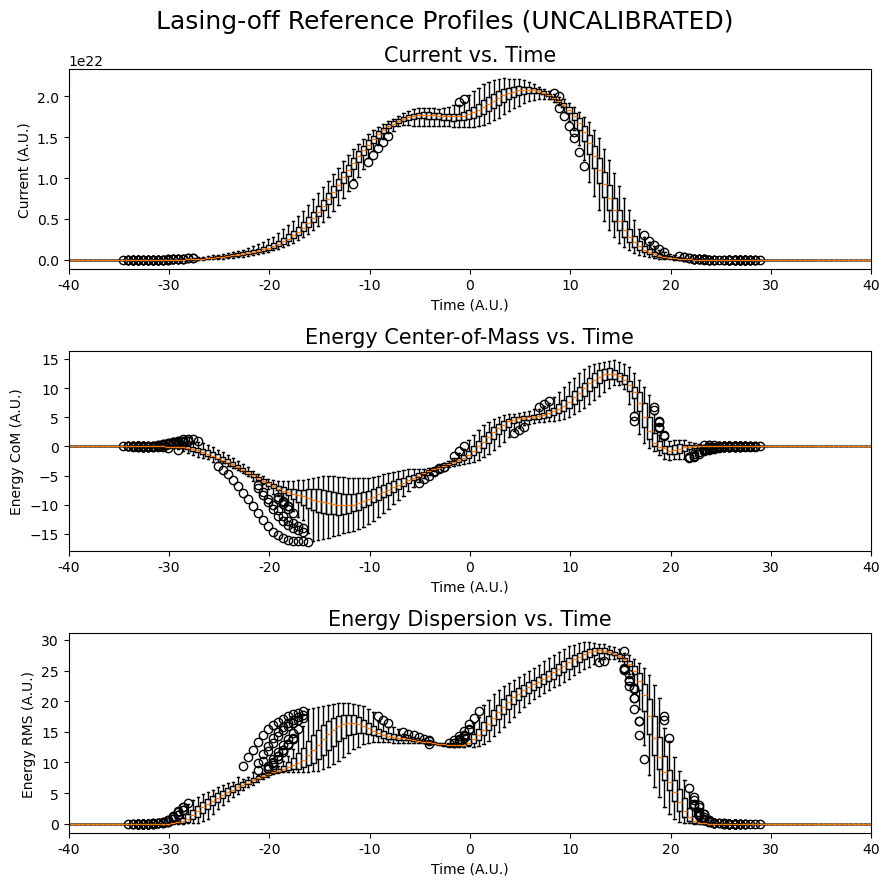

In [16]:
# Show reference profile boxplots: 1'st pulse

xtoff.show_reference_profiles_boxplots(
    idx_pulse=0,
    lims=[-40,40]
)

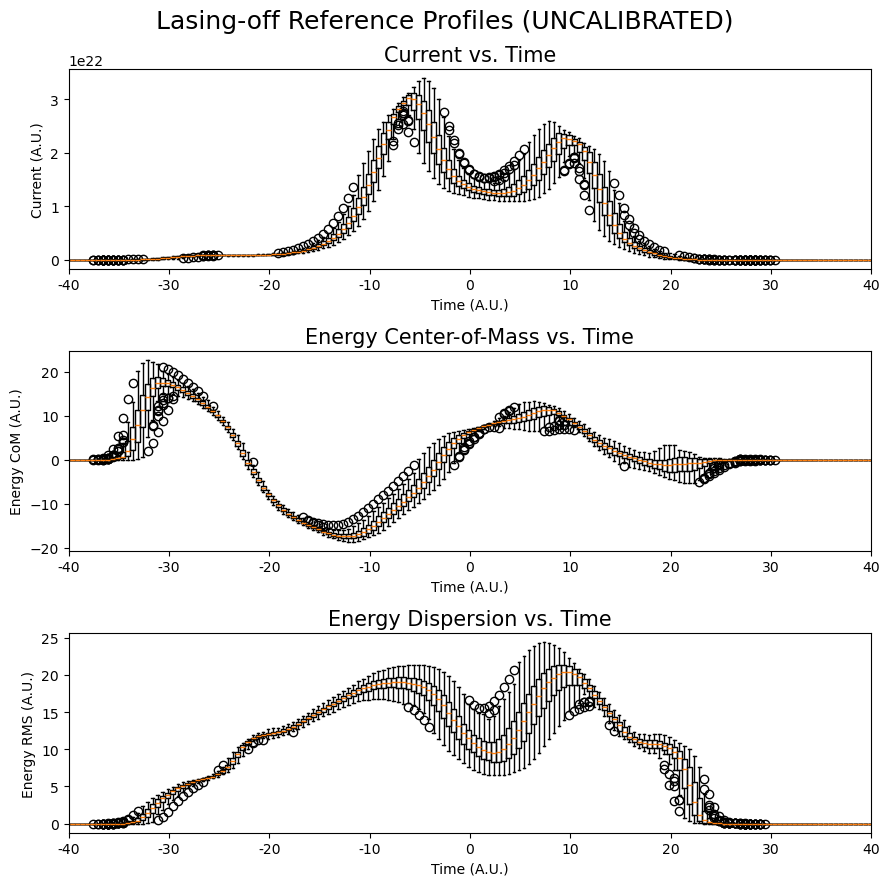

In [17]:
# Show reference profile boxplots: 2'nd pulse

xtoff.show_reference_profiles_boxplots(
    idx_pulse=1,
    lims=[-40,40]
)

# Lasing-on Reconstructions

Setting up data run times...
Done.


XTCAV:0: UserWarning: No XTCAV Calibration for epics variable XTCAV_Beam_energy_dump_GeV
/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:171: UserWarning: Failed to find all global calibrations!
  warnings.warn('Failed to find all global calibrations!')


Setting data source types...:   0%|          | 0/50400 [00:00<?, ?it/s]

Data source types successfully set.
Electron beam source type is <class 'psana.Bld.BldDataEBeamV7'>
Gas detector source type is <class 'psana.Bld.BldDataFEEGasDetEnergyV1'>


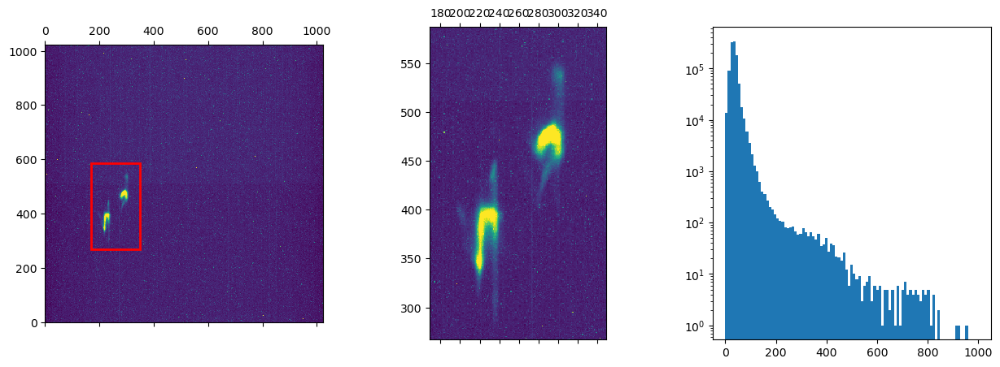

In [18]:
# Create object
xton = XTCAVLasingOnReconstruction(
    get_datasource(runnum_lasingon),
    fov = fov,
    dark_reference = xtdr,
    lasing_off = xtoff,
    n_pulses = n_pulses,
)

# Examine the first event
i,j,evt = next(xton.shot_iterator)
xton.set_current_event(evt)
xton.show_current_frame(
    vrange=(0,350),
    bins=np.linspace(0,1000,100),
)

Looping through the next 3 'ok' events...
Showing 'ok' shot #2 at time index 270:


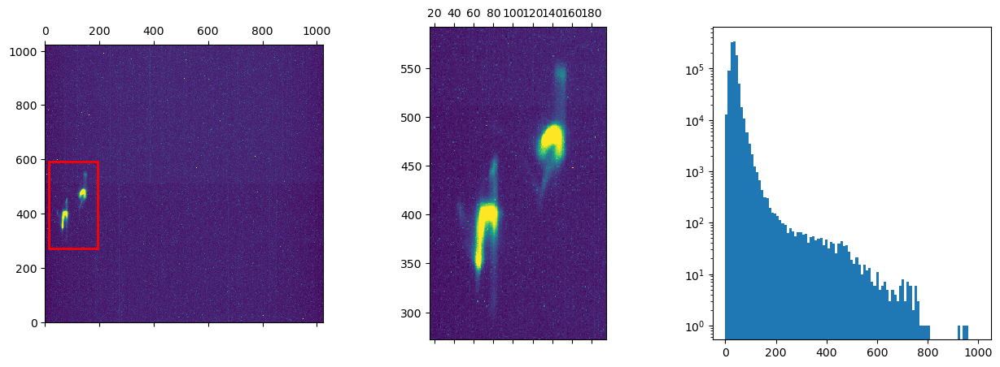

Showing 'ok' shot #3 at time index 271:


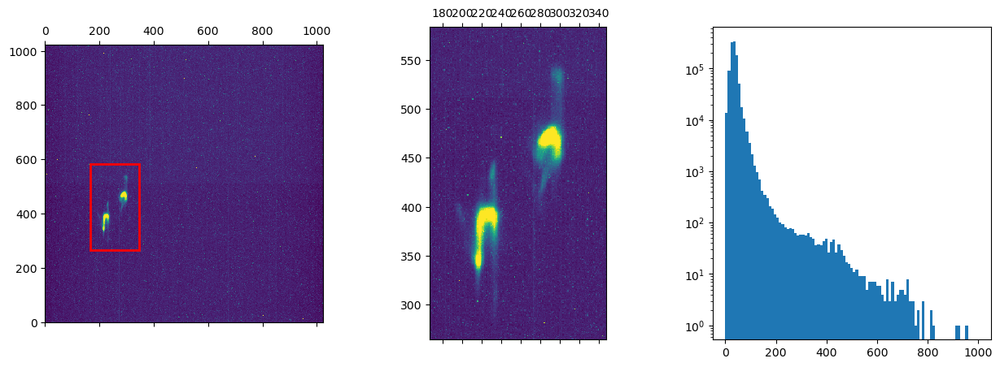

Showing 'ok' shot #4 at time index 272:


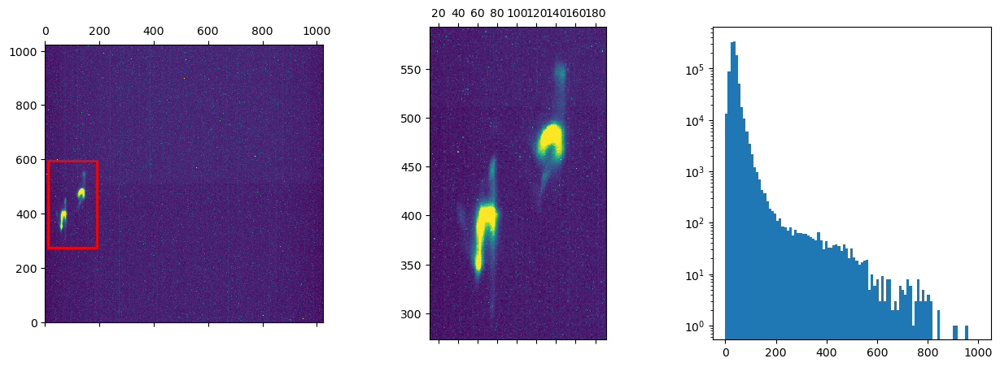

In [19]:
# Examine a few more events

n_shots_show = 3

print(f"Looping through the next {n_shots_show} 'ok' events...")
for idx,(i,j,evt) in enumerate(xton.shot_iterator):
    print(f"Showing 'ok' shot #{i+1} at time index {j}:")

    # Get & show event
    xton.set_current_event(evt)
    xton.show_current_frame()

    # continue?
    if idx>=n_shots_show-1:
        break

Looping through the first 3 'ok' events...
Showing 'ok' shot #1 at time index 269:


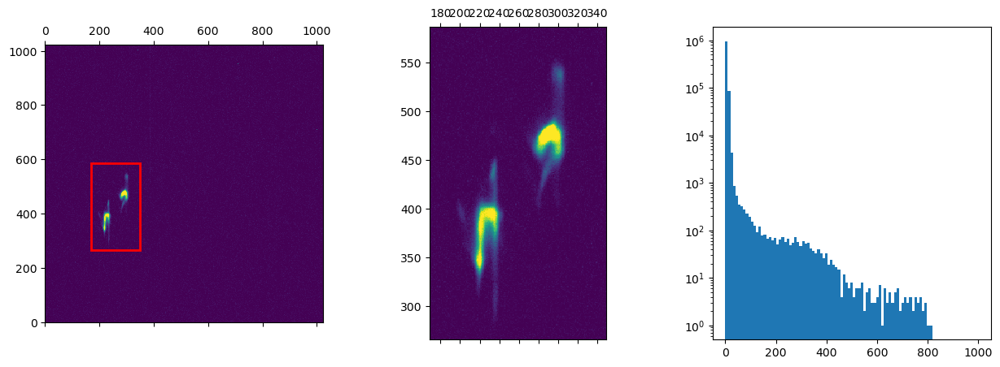

Showing 'ok' shot #2 at time index 270:


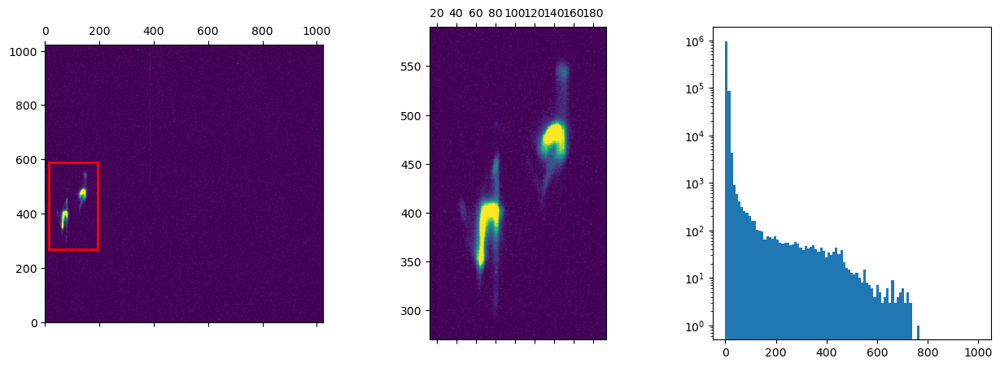

Showing 'ok' shot #3 at time index 271:


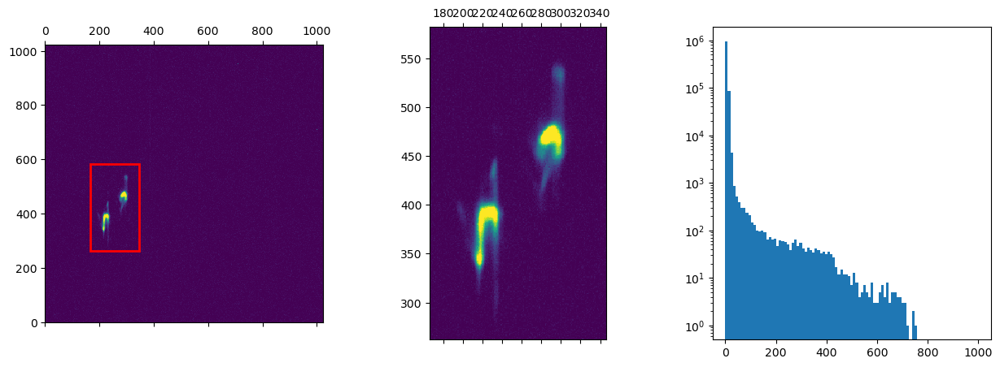

In [20]:
# Background subtraction

# Set dark ref
#xton.set_darkreference(xtdr)

# Examine dark ref subtracted data
xton.reset_shot_iterator()
n_shots_show = 3
print(f"Looping through the first {n_shots_show} 'ok' events...")
for idx,(i,j,evt) in enumerate(xton.shot_iterator):
    print(f"Showing 'ok' shot #{i+1} at time index {j}:")

    # Get & show event
    xton.set_current_event(evt)
    xton.show_current_frame(preprocess='bksb')

    # continue?
    if idx>=n_shots_show-1:
        break

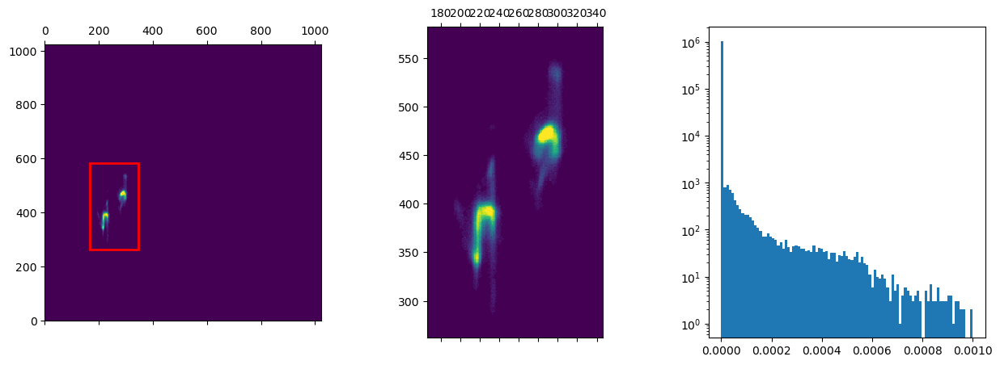

In [21]:
# Denoise

xton.show_frame(
    frame = xton.get_frame_denoised_current(
        nstd=1,                              # auto updates default params
        close=2
    ),
    vrange=(0,6e-4),                         # update intensity display range;
    bins=np.linspace(0,1e-3,100),            # denoising also normalizes total image intensity to 1
)

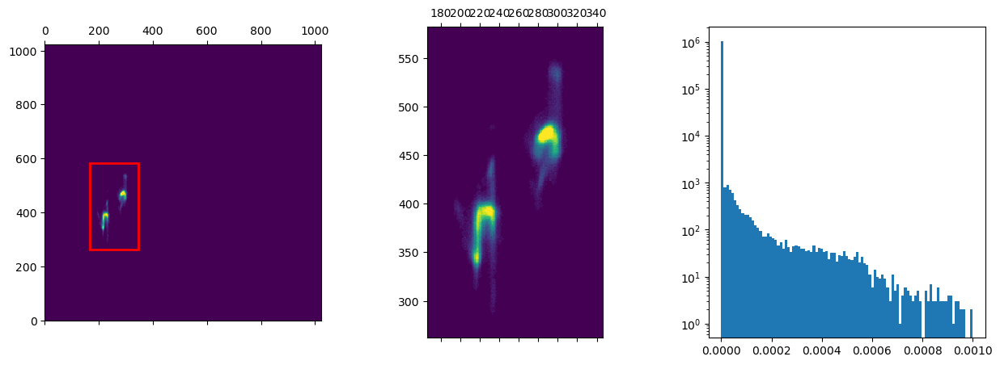

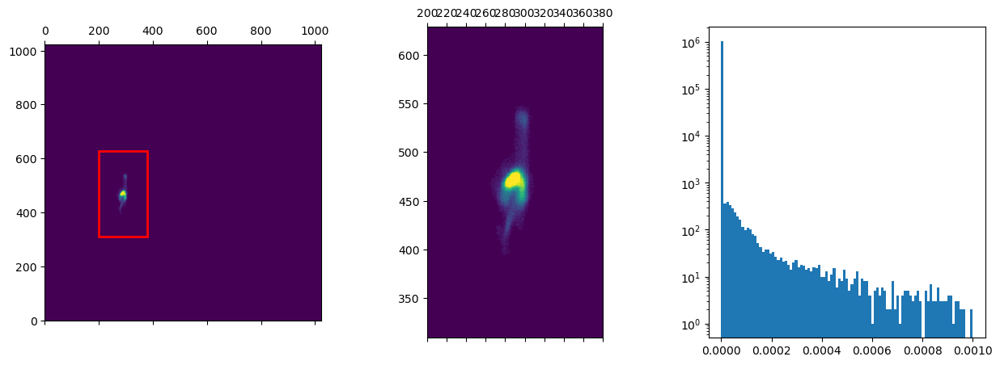

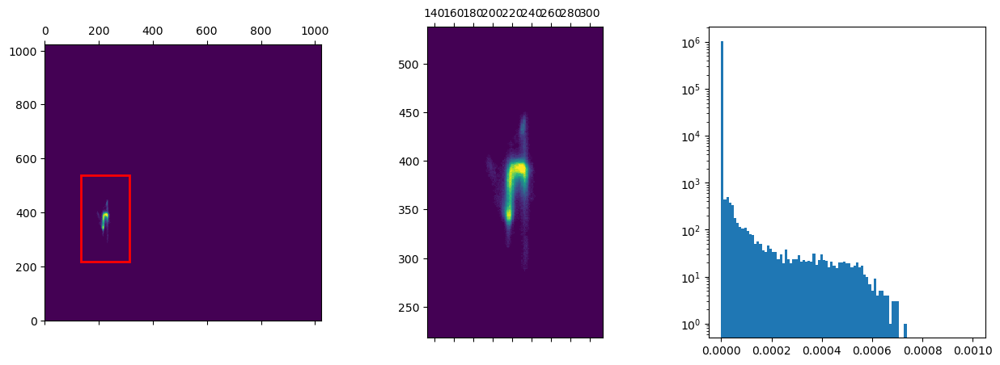

In [22]:
# Split images

# Get a denoised frame & split its pulses
im = xton.get_frame_denoised_current()
ims,ok = xton.split_frame(im)
assert(ok), "Failed to split image frame"

# Show
for image in (im,ims[0],ims[1]):   # Original image, pulse 1, and pulse 2
    xton.show_frame(image)

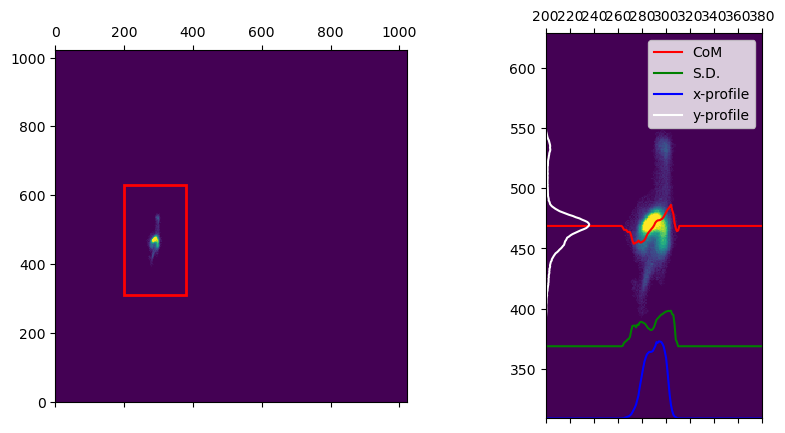

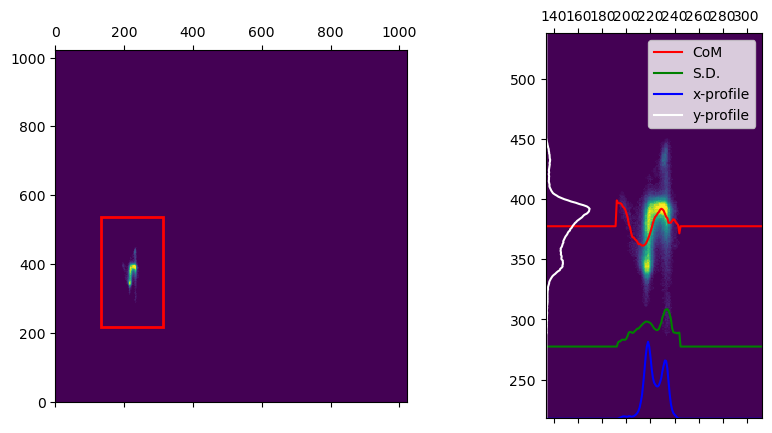

In [23]:
# Get image statistics

frame1,frame2 = ims[0],ims[1]
imageStats1 = xton.get_pulse_statistics(frame1)
imageStats2 = xton.get_pulse_statistics(frame2)

# Show
xton.show_frame_statistics(
    frame1,
    imageStats1,
)
xton.show_frame_statistics(
    frame2,
    imageStats2,
)

## Get full lasing-on data run image statistics

In [24]:
xton.get_shot_by_shot_statistics( n_pulses=2, _n_shots_max=100 )

Calculating shot-by-shot statistics...:   0%|          | 0/100 [00:00<?, ?it/s]

/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1380: UserWarning: Hardcoded calibrations are not yet calculated - returning uncalibrated axes!
  warnings.warn("Hardcoded calibrations are not yet calculated - returning uncalibrated axes!")


Done. Calculated statistics for 90 'good' shots.
Setting shot iterator to traverse good shots only.


/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:649: UserWarning: 'Good' shots have not yet been determined during initial pass; using 'ok' shot iterator.
  warnings.warn("'Good' shots have not yet been determined during initial pass; using 'ok' shot iterator.")


-------------------------------
Showing usable shot #1:
-------------------------------


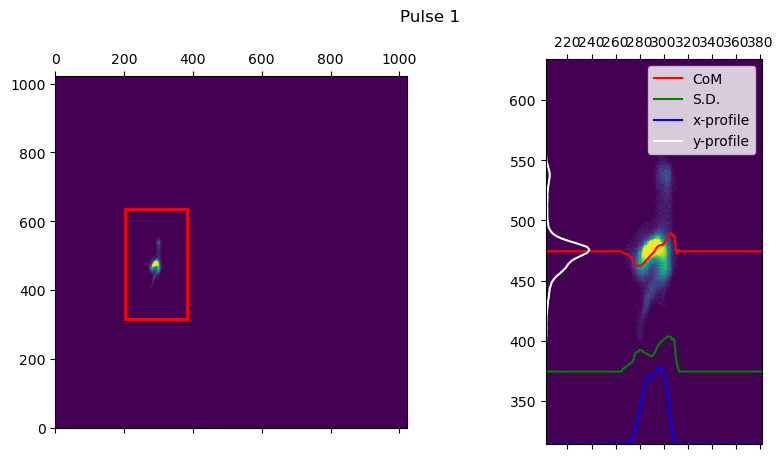

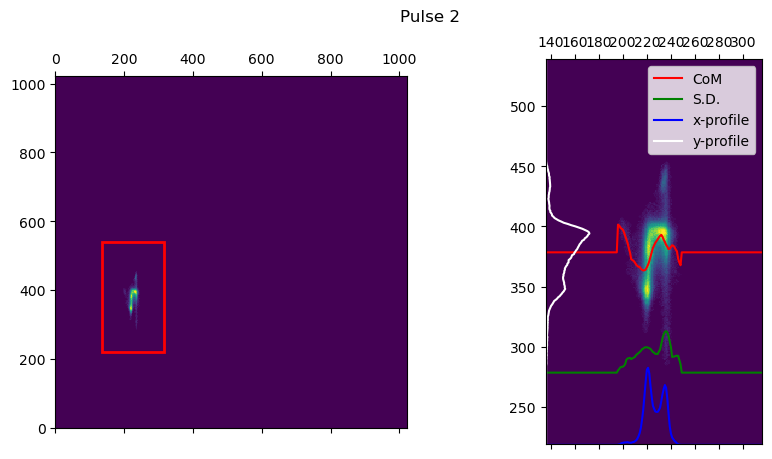

-------------------------------
Showing usable shot #21:
-------------------------------


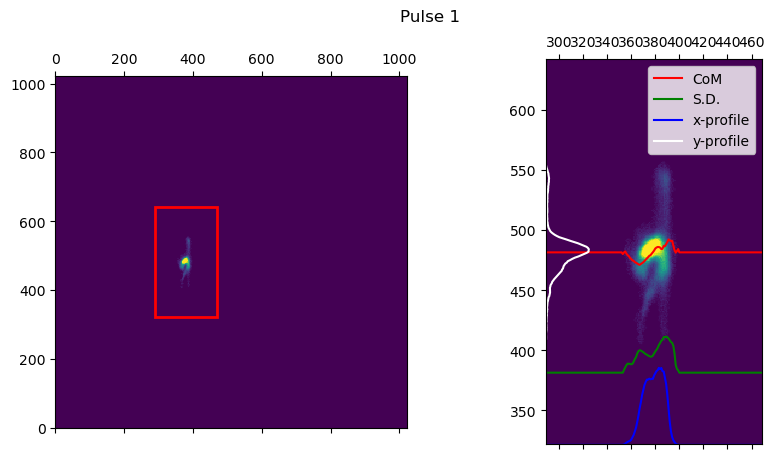

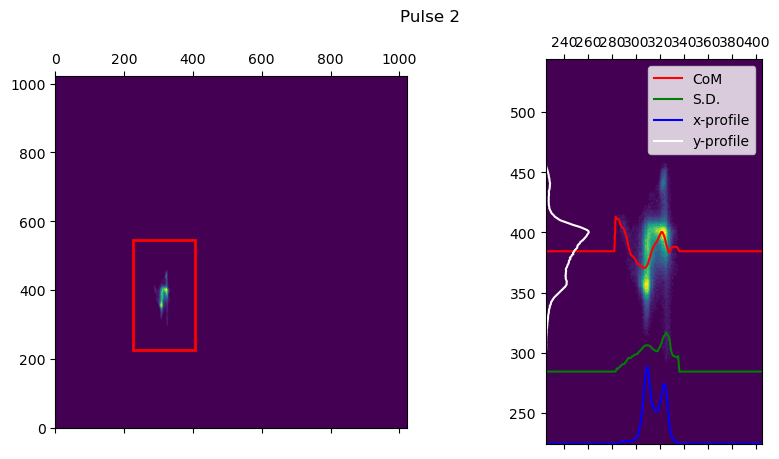

-------------------------------
Showing usable shot #51:
-------------------------------


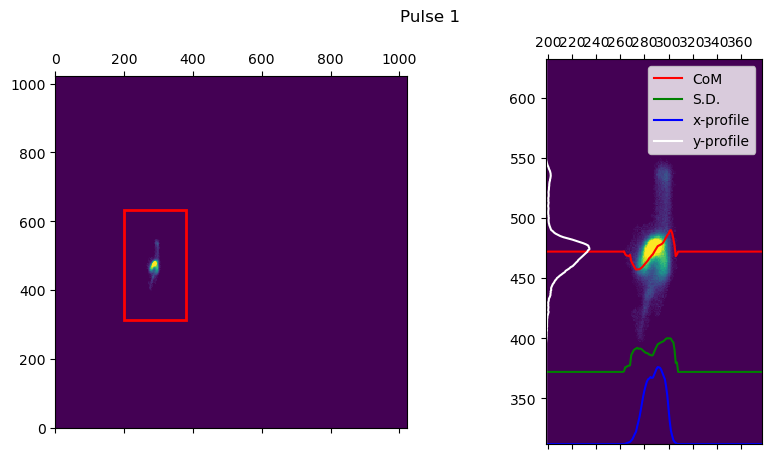

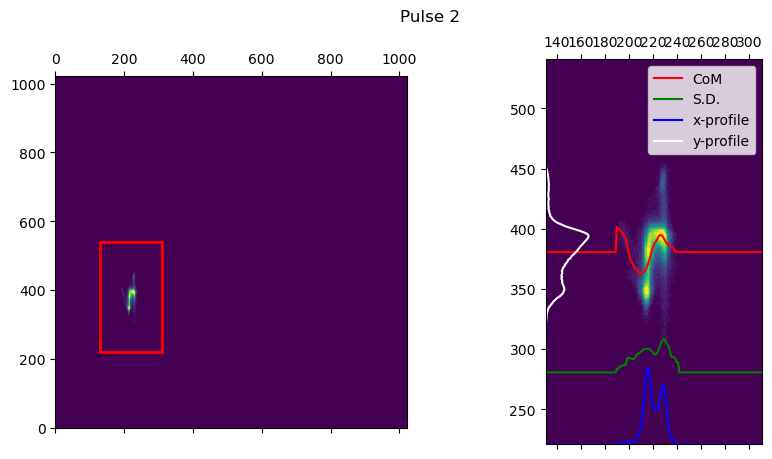

-------------------------------
Showing usable shot #90:
-------------------------------


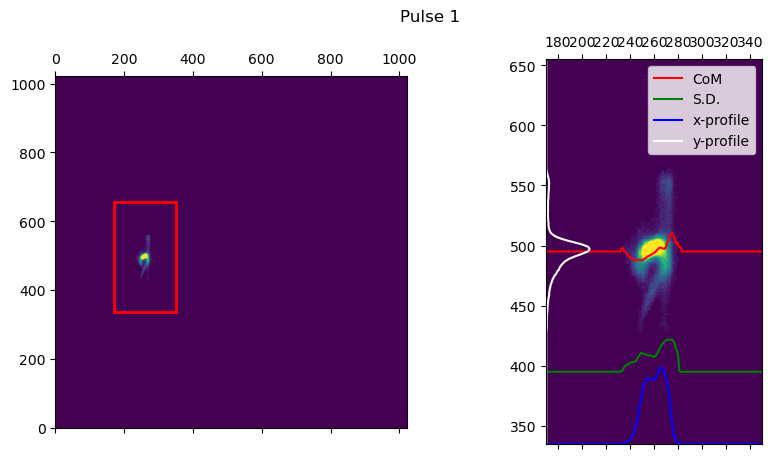

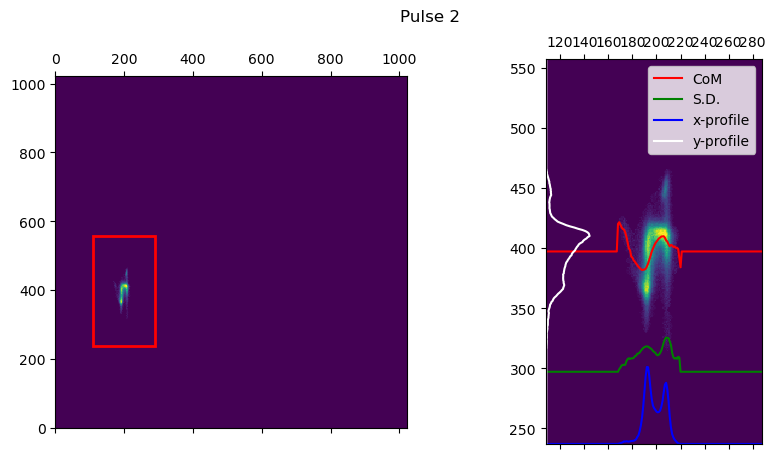

In [25]:
# Show a few shots & their pulse statistics

#for i in [0,200,500,910]:       # select a few shots
for i in [0,20,50,89]:       # select a few shots
    print("-------------------------------")
    print(f"Showing usable shot #{i+1}:")
    print("-------------------------------")
    xton.show_pulse_statistics(
        i,
        n_pulses=2,
    )

## Reconstruct power profiles

In [26]:
# Set lasing-off reference
recon = xton.get_single_shot_power_profile(1)

print(recon)

{'t': array([-520.12014859, -519.62014859, -519.12014859, ...,  863.87985141,
        864.37985141,  864.87985141]), 'powerrawECOM': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'powerrawERMS': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'powerECOM': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'powerERMS': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]]), 'powerAgreement': array([0.90914765, 0.46987062]), 'pulse_delay': array([  0.        , -66.69388533]), 'pulse_delaychange': array([ 0.       , -0.6556933]), 'xrayenergy': 0.0003336027756081421, 'lasingenergyperpulse_ECOM': array([0.00014971, 0.00018373]), 'lasingenergyperpulse_ERMS': array([0.000102 , 0.0002316]), 'pulse_energydiff': array([  0.        , -91.25441953]), 'pulse_energydiffchange': array([0.        , 2.16175752]), 'lasingECurrent': array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 

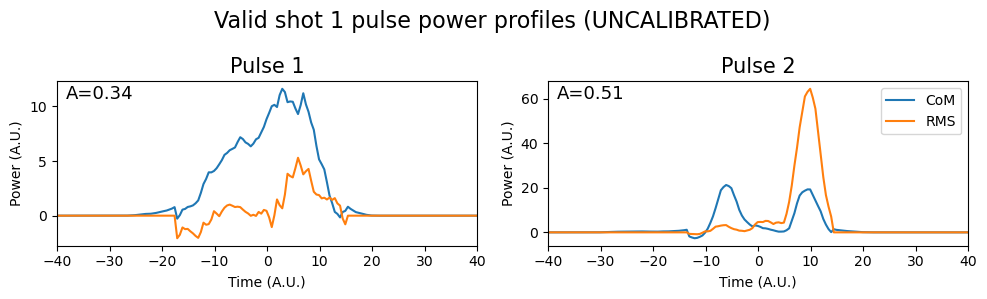

In [27]:
idx = 0

# Get reconstructions
recon = xton.get_single_shot_power_profile(idx)

# Get stats
t = recon['t']
powerECOM = recon['powerECOM']
powerERMS = recon['powerERMS']
agreement = recon['powerAgreement']

# Show
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
ax1.plot(t,powerECOM[0],label='CoM')
ax1.plot(t,powerERMS[0],label='RMS')
ax2.plot(t,powerECOM[1],label='CoM')
ax2.plot(t,powerERMS[1],label='RMS')
ax1.set_xlim(-40,40)
ax2.set_xlim(-40,40)
ax1.set_title('Pulse 1',size=15)
ax2.set_title('Pulse 2',size=15)
ax1.set_xlabel('Time (A.U.)')
ax2.set_xlabel('Time (A.U.)')
ax1.set_ylabel('Power (A.U.)')
ax2.set_ylabel('Power (A.U.)')
ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
plt.legend()
plt.suptitle(f'Valid shot {idx+1} pulse power profiles (UNCALIBRATED)', size=16)
plt.tight_layout()
plt.show()

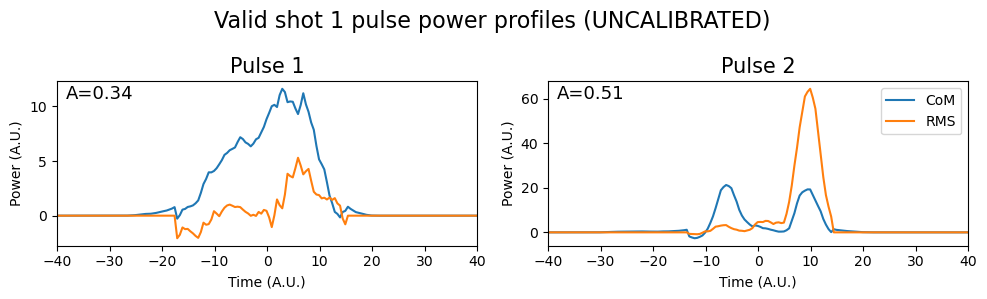

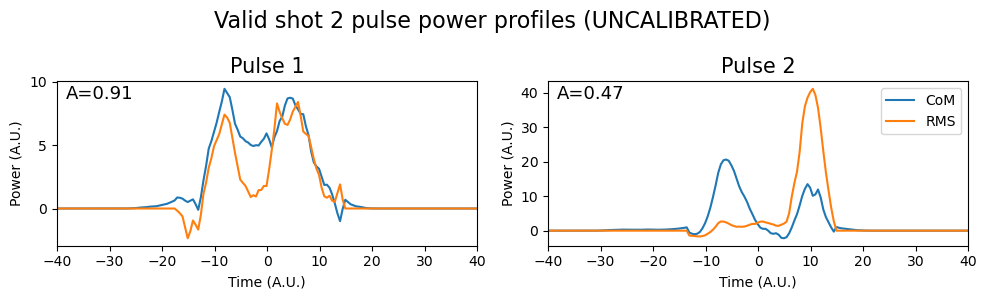

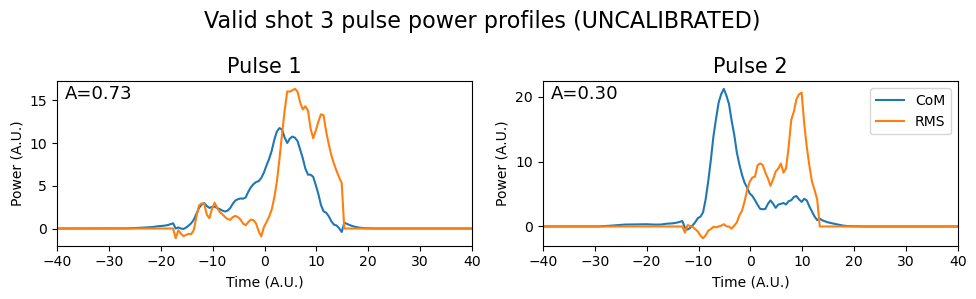

In [28]:
for idx in np.arange(3):

    # Get reconstructions
    recon = xton.get_single_shot_power_profile(idx)
    
    # Get stats
    t = recon['t']
    powerECOM = recon['powerECOM']
    powerERMS = recon['powerERMS']
    agreement = recon['powerAgreement']
    
    # Show
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
    ax1.plot(t,powerECOM[0],label='CoM')
    ax1.plot(t,powerERMS[0],label='RMS')
    ax2.plot(t,powerECOM[1],label='CoM')
    ax2.plot(t,powerERMS[1],label='RMS')
    ax1.set_xlim(-40,40)
    ax2.set_xlim(-40,40)
    ax1.set_title('Pulse 1',size=15)
    ax2.set_title('Pulse 2',size=15)
    ax1.set_xlabel('Time (A.U.)')
    ax2.set_xlabel('Time (A.U.)')
    ax1.set_ylabel('Power (A.U.)')
    ax2.set_ylabel('Power (A.U.)')
    ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
    ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
    plt.legend()
    plt.suptitle(f'Valid shot {idx+1} pulse power profiles (UNCALIBRATED)', size=16)
    plt.tight_layout()
    plt.show()

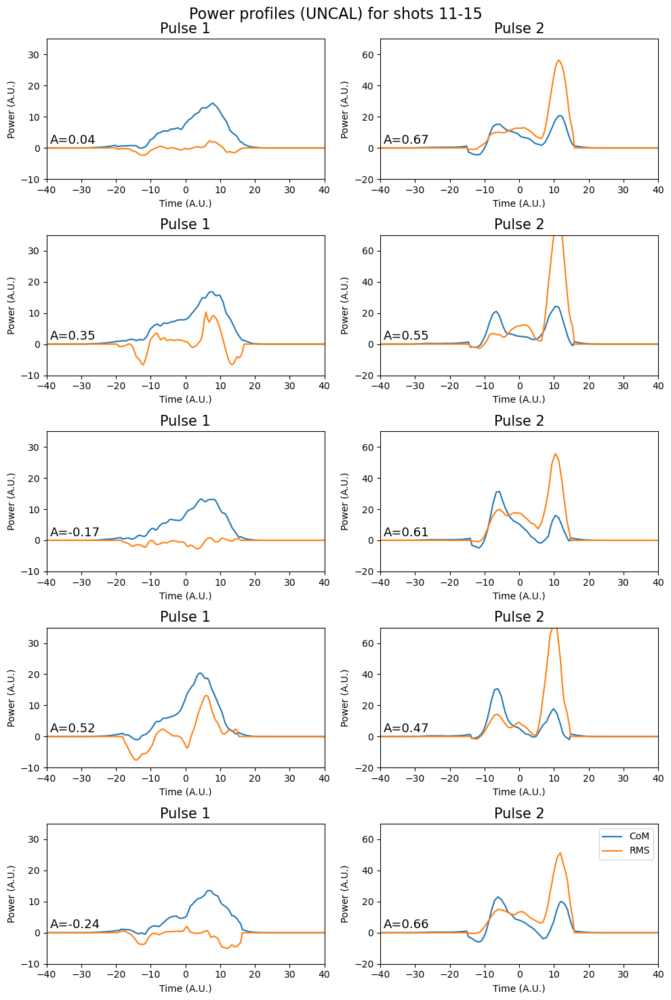

In [29]:
# Set shots
idx_first_shot = 10
n_shots_plot = 5
shots_plot = np.arange(idx_first_shot,idx_first_shot+n_shots_plot)

# Setup figure
fig,axs = plt.subplots(n_shots_plot,2,figsize=(10,3*n_shots_plot))

# Loop
for i,idx in enumerate(shots_plot):
    
    # Get reconstructions
    recon = xton.get_single_shot_power_profile(idx)
    
    # Get stats
    t = recon['t']
    powerECOM = recon['powerECOM']
    powerERMS = recon['powerERMS']
    agreement = recon['powerAgreement']

    # Get axes
    ax1,ax2 = axs[i]
    
    # Show
    ax1.plot(t,powerECOM[0],label='CoM')
    ax1.plot(t,powerERMS[0],label='RMS')
    ax2.plot(t,powerECOM[1],label='CoM')
    ax2.plot(t,powerERMS[1],label='RMS')
    ax1.set_xlim(-40,40)
    ax2.set_xlim(-40,40)
    ax1.set_ylim(-10,35)
    ax2.set_ylim(-20,70)
    ax1.set_title('Pulse 1',size=15)
    ax2.set_title('Pulse 2',size=15)
    ax1.set_xlabel('Time (A.U.)')
    ax2.set_xlabel('Time (A.U.)')
    ax1.set_ylabel('Power (A.U.)')
    ax2.set_ylabel('Power (A.U.)')
    # ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
    # ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
    ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
    ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)
    
plt.legend()
plt.suptitle(f'Power profiles (UNCAL) for shots {idx_first_shot+1}-{idx_first_shot+n_shots_plot}', size=16)
plt.tight_layout()
plt.show()

In [30]:
agreement_factors = np.empty((2,len(xton._times_good)))

for idx in range(len(xton._times_good)):
    recon = xton.get_single_shot_power_profile(idx)
    agreement_factors[0,idx] = recon['powerAgreement'][0]
    agreement_factors[1,idx] = recon['powerAgreement'][1]

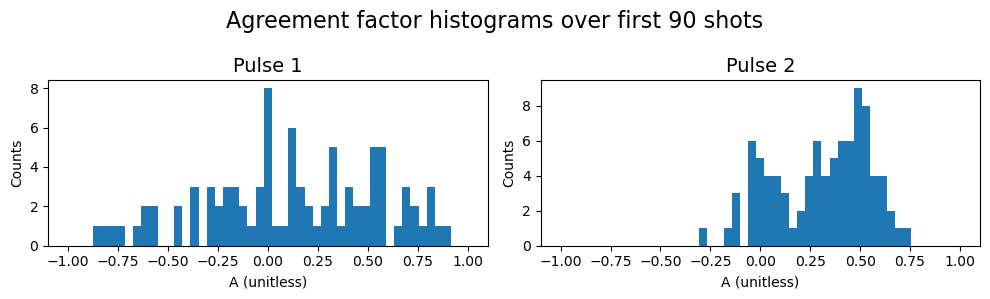

In [31]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
ax1.hist(agreement_factors[0],bins=np.linspace(-1,1))
ax2.hist(agreement_factors[1],bins=np.linspace(-1,1))
ax1.set_title('Pulse 1', size=14)
ax2.set_title('Pulse 2', size=14)
ax1.set_xlabel('A (unitless)')
ax2.set_xlabel('A (unitless)')
ax1.set_ylabel('Counts')
ax2.set_ylabel('Counts')
plt.suptitle(f'Agreement factor histograms over first {len(xton._times_good)} shots',size=16)
plt.tight_layout()
plt.show()

### Agreement factor statistics

In [32]:
# xton.reset_shot_iterator()
# xton.reset_iteration_type('ok')

# xton.get_shot_by_shot_statistics( n_pulses=2 )
xton.get_shot_by_shot_statistics( n_pulses=2, _n_shots_max=5000 )

Calculating shot-by-shot statistics...:   0%|          | 0/5000 [00:00<?, ?it/s]

/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1526: RuntimeWarning: invalid value encountered in scalar divide
  x = np.sum(xx*ar)/m
/sdf/home/b/bsavitzk/L-10376/XTCAV/xtcav_processor.py:1527: RuntimeWarning: invalid value encountered in scalar divide
  y = np.sum(yy*ar)/m


Done. Calculated statistics for 4584 'good' shots.
Setting shot iterator to traverse good shots only.


In [33]:
from tqdm.auto import tqdm

Calculating agreement factors:   0%|          | 0/4584 [00:00<?, ?it/s]

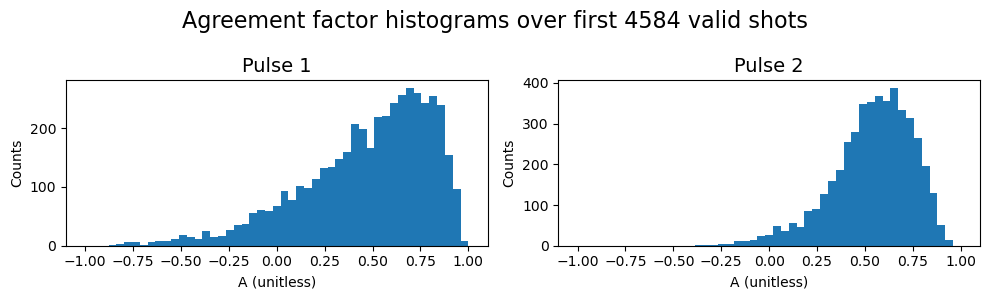

In [34]:
agreement_factors = np.empty((2,len(xton._times_good)))

for idx in tqdm(range(len(xton._times_good)),desc="Calculating agreement factors"):
    recon = xton.get_single_shot_power_profile(idx)
    agreement_factors[0,idx] = recon['powerAgreement'][0]
    agreement_factors[1,idx] = recon['powerAgreement'][1]
    
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
ax1.hist(agreement_factors[0],bins=np.linspace(-1,1))
ax2.hist(agreement_factors[1],bins=np.linspace(-1,1))
ax1.set_title('Pulse 1', size=14)
ax2.set_title('Pulse 2', size=14)
ax1.set_xlabel('A (unitless)')
ax2.set_xlabel('A (unitless)')
ax1.set_ylabel('Counts')
ax2.set_ylabel('Counts')
plt.suptitle(f'Agreement factor histograms over first {len(xton._times_good)} valid shots',size=16)
plt.tight_layout()
plt.show()

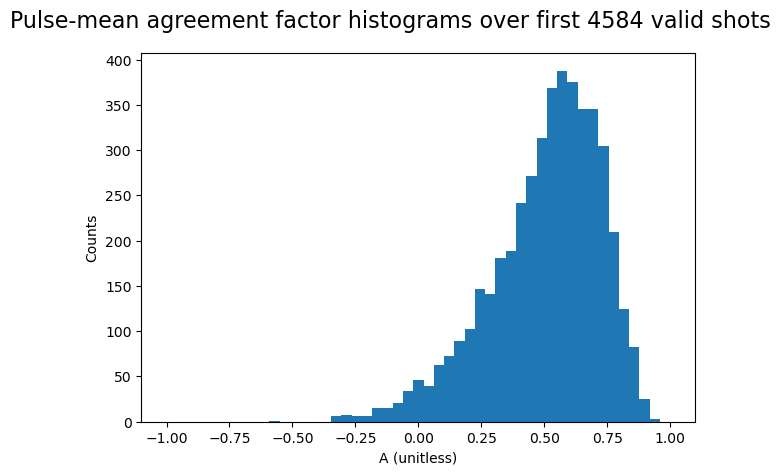

In [35]:
agreement_factor_means = np.mean(agreement_factors,axis=0)

fig,ax = plt.subplots()
ax.hist(agreement_factor_means,bins=np.linspace(-1,1))
ax.set_xlabel('A (unitless)')
ax.set_ylabel('Counts')
plt.suptitle(f'Pulse-mean agreement factor histograms over first {len(xton._times_good)} valid shots',size=16)
plt.tight_layout()
plt.show()

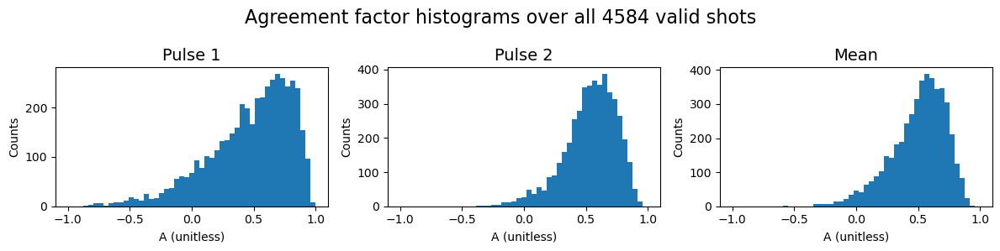

In [36]:
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,3))
ax1.hist(agreement_factors[0],bins=np.linspace(-1,1))
ax2.hist(agreement_factors[1],bins=np.linspace(-1,1))
ax3.hist(agreement_factor_means,bins=np.linspace(-1,1))
ax1.set_title('Pulse 1', size=14)
ax2.set_title('Pulse 2', size=14)
ax3.set_title('Mean', size=14)
ax1.set_xlabel('A (unitless)')
ax2.set_xlabel('A (unitless)')
ax3.set_xlabel('A (unitless)')
ax1.set_ylabel('Counts')
ax2.set_ylabel('Counts')
ax3.set_ylabel('Counts')
#plt.suptitle(f'Agreement factor histograms over first {len(xton._times_good)} valid shots',size=16)
plt.suptitle(f'Agreement factor histograms over all {len(xton._times_good)} valid shots',size=16)
plt.tight_layout()
plt.show()

In [37]:
# How many shots with decent agreement are there

vals = np.arange(0,1.001,0.05)
nums = np.zeros(len(vals),dtype=int)
inds = []
for val in vals:
    indices = np.where(agreement_factor_means>=val)[0]
    inds.append(indices)

In [38]:
vals = np.arange(-1,1.001,0.01)
nums_1 = np.zeros(len(vals),dtype=int)
nums_2 = np.zeros(len(vals),dtype=int)
nums_mean = np.zeros(len(vals),dtype=int)
cumsum_1 = np.zeros(201)
cumsum_2 = np.zeros(201)
cumsum_mean = np.zeros(201)
inds_1 = []
inds_2 = []
inds_mean = []
for i,val in enumerate(tqdm(vals,desc='Calculating cumulative sums')):
    indices_1 = np.where(agreement_factors[0]>=val)[0]
    indices_2 = np.where(agreement_factors[1]>=val)[0]
    indices_mean = np.where(agreement_factor_means>=val)[0]
    inds_1.append(indices_1)
    inds_2.append(indices_2)
    inds_mean.append(indices_mean)
    cumsum_1[i] = len(indices_1)
    cumsum_2[i] = len(indices_2)
    cumsum_mean[i] = len(indices_mean)

Calculating cumulative sums:   0%|          | 0/201 [00:00<?, ?it/s]

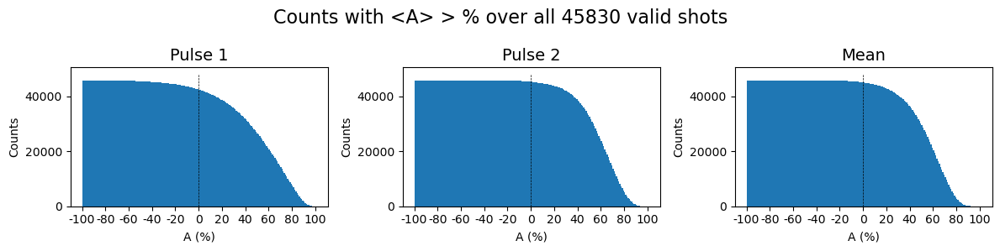

In [202]:
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,3))
ax1.bar(
    x=np.arange(201),
    height=cumsum_1,
    width=1,
    align='edge'
)
ax2.bar(
    x=np.arange(201),
    height=cumsum_2,
    width=1,
    align='edge'
)
ax3.bar(
    x=np.arange(201),
    height=cumsum_mean,
    width=1,
    align='edge'
)
ax1.set_title('Pulse 1', size=14)
ax2.set_title('Pulse 2', size=14)
ax3.set_title('Mean', size=14)
ax1.set_xlabel('A (%)')
ax2.set_xlabel('A (%)')
ax3.set_xlabel('A (%)')
ax1.set_ylabel('Counts')
ax2.set_ylabel('Counts')
ax3.set_ylabel('Counts')
ax1.vlines(100,0,ax1.get_ylim()[1],color='k',lw=0.5,ls='--')
ax1.set_xticks(np.arange(0,201,20))
ax1.set_xticklabels(np.arange(-100,101,20))
ax2.vlines(100,0,ax2.get_ylim()[1],color='k',lw=0.5,ls='--')
ax2.set_xticks(np.arange(0,201,20))
ax2.set_xticklabels(np.arange(-100,101,20))
ax3.vlines(100,0,ax3.get_ylim()[1],color='k',lw=0.5,ls='--')
ax3.set_xticks(np.arange(0,201,20))
ax3.set_xticklabels(np.arange(-100,101,20))
# plt.suptitle(f'Counts with <A> > % in the first {len(xton._times_good)} valid shots',size=16)
plt.suptitle(f'Counts with <A> > % over all {len(xton._times_good)} valid shots',size=16)
plt.tight_layout()
plt.show()

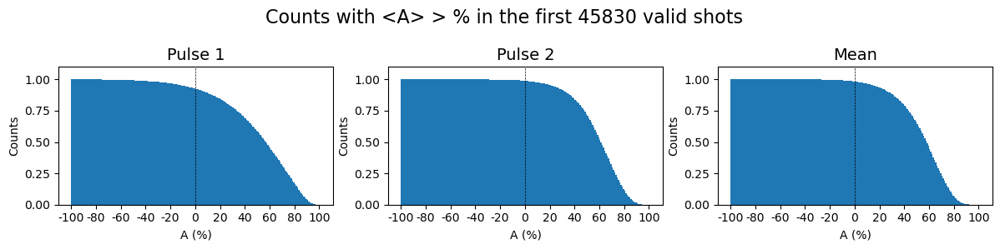

In [201]:
norm = np.max(cumsum_1)
x = np.arange(201)
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,3))
ax1.bar(
    x=x,
    height=cumsum_1/norm,
    width=1,
    align='edge'
)
ax2.bar(
    x=x,
    height=cumsum_2/norm,
    width=1,
    align='edge'
)
ax3.bar(
    x=x,
    height=cumsum_mean/norm,
    width=1,
    align='edge'
)
ax1.set_title('Pulse 1', size=14)
ax2.set_title('Pulse 2', size=14)
ax3.set_title('Mean', size=14)
ax1.set_xlabel('A (%)')
ax2.set_xlabel('A (%)')
ax3.set_xlabel('A (%)')
ax1.set_ylabel('Counts')
ax2.set_ylabel('Counts')
ax3.set_ylabel('Counts')
ax1.set_ylim(0,1.1)
ax2.set_ylim(0,1.1)
ax3.set_ylim(0,1.1)
ax1.set_xticks(np.arange(0,201,20))
ax1.set_xticklabels(np.arange(-100,101,20))
ax2.set_xticks(np.arange(0,201,20))
ax2.set_xticklabels(np.arange(-100,101,20))
ax3.set_xticks(np.arange(0,201,20))
ax3.set_xticklabels(np.arange(-100,101,20))
ax1.vlines(100,0,ax1.get_ylim()[1],color='k',lw=0.5,ls='--')
ax2.vlines(100,0,ax2.get_ylim()[1],color='k',lw=0.5,ls='--')
ax3.vlines(100,0,ax3.get_ylim()[1],color='k',lw=0.5,ls='--')
# plt.suptitle(f'Counts with <A> > % in the first {len(xton._times_good)} valid shots',size=16)
plt.suptitle(f'Counts with <A> > % over all {len(xton._times_good)} valid shots',size=16)
plt.tight_layout()
plt.show()

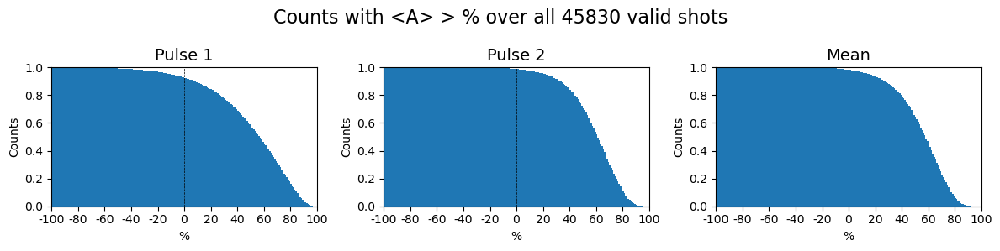

In [203]:
norm = np.max(cumsum_1)
x = np.arange(201)
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,3))
ax1.bar(
    x=x,
    height=cumsum_1/norm,
    width=1,
    align='edge'
)
ax2.bar(
    x=x,
    height=cumsum_2/norm,
    width=1,
    align='edge'
)
ax3.bar(
    x=x,
    height=cumsum_mean/norm,
    width=1,
    align='edge'
)
ax1.set_title('Pulse 1', size=14)
ax2.set_title('Pulse 2', size=14)
ax3.set_title('Mean', size=14)
ax1.set_xlabel('%')
ax2.set_xlabel('%')
ax3.set_xlabel('%')
ax1.set_ylabel('Counts')
ax2.set_ylabel('Counts')
ax3.set_ylabel('Counts')
ax1.set_ylim(0,1)
ax2.set_ylim(0,1)
ax3.set_ylim(0,1)
ax1.set_xlim(0,200)
ax2.set_xlim(0,200)
ax3.set_xlim(0,200)
ax1.set_xticks(np.arange(0,201,20))
ax1.set_xticklabels(np.arange(-100,101,20))
ax2.set_xticks(np.arange(0,201,20))
ax2.set_xticklabels(np.arange(-100,101,20))
ax3.set_xticks(np.arange(0,201,20))
ax3.set_xticklabels(np.arange(-100,101,20))
ax1.vlines(100,0,ax1.get_ylim()[1],color='k',lw=0.5,ls='--')
ax2.vlines(100,0,ax2.get_ylim()[1],color='k',lw=0.5,ls='--')
ax3.vlines(100,0,ax3.get_ylim()[1],color='k',lw=0.5,ls='--')
# plt.suptitle(f'Counts with <A> > % in the first {len(xton._times_good)} valid shots',size=16)
plt.suptitle(f'Counts with <A> > % over all {len(xton._times_good)} valid shots',size=16)
plt.tight_layout()
plt.show()

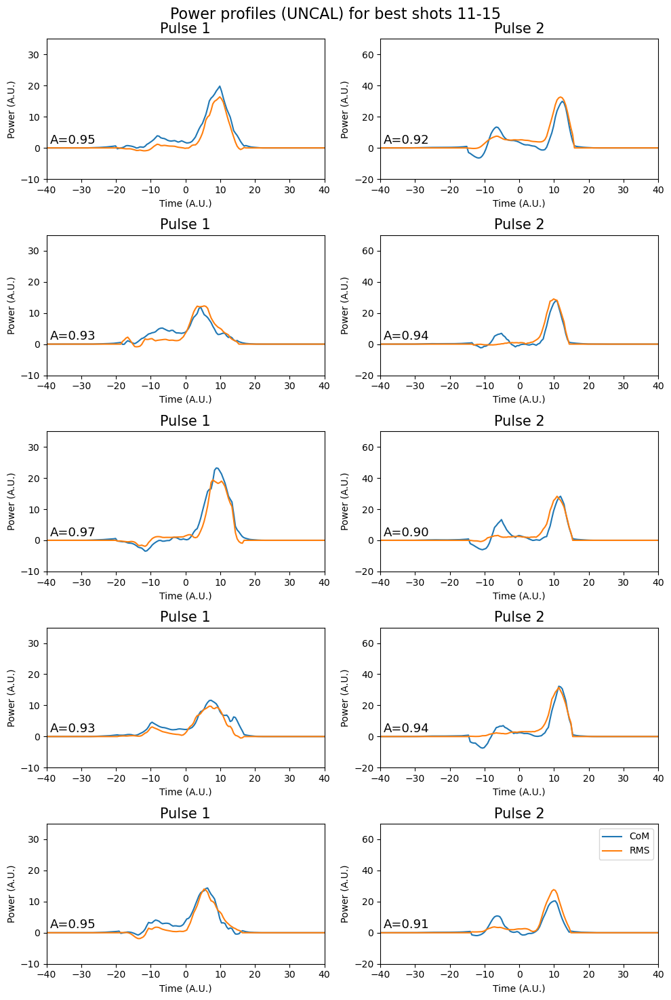

In [207]:
## BEST SHOTS

inds_ordered = np.argsort(agreement_factor_means)[::-1]

# Set shots
idx_first_shot = 10
n_shots_plot = 5
idces_shots_plot = np.arange(idx_first_shot,idx_first_shot+n_shots_plot)
shots_plot = inds_ordered[idces_shots_plot]


# Setup figure
fig,axs = plt.subplots(n_shots_plot,2,figsize=(10,3*n_shots_plot))

# Loop
for i,idx in enumerate(shots_plot):
    
    # Get reconstructions
    recon = xton.get_single_shot_power_profile(idx)
    
    # Get stats
    t = recon['t']
    powerECOM = recon['powerECOM']
    powerERMS = recon['powerERMS']
    agreement = recon['powerAgreement']

    # Get axes
    ax1,ax2 = axs[i]
    
    # Show
    ax1.plot(t,powerECOM[0],label='CoM')
    ax1.plot(t,powerERMS[0],label='RMS')
    ax2.plot(t,powerECOM[1],label='CoM')
    ax2.plot(t,powerERMS[1],label='RMS')
    ax1.set_xlim(-40,40)
    ax2.set_xlim(-40,40)
    ax1.set_ylim(-10,35)
    ax2.set_ylim(-20,70)
    ax1.set_title('Pulse 1',size=15)
    ax2.set_title('Pulse 2',size=15)
    ax1.set_xlabel('Time (A.U.)')
    ax2.set_xlabel('Time (A.U.)')
    ax1.set_ylabel('Power (A.U.)')
    ax2.set_ylabel('Power (A.U.)')
    # ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
    # ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
    ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
    ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)
    
plt.legend()
plt.suptitle(f'Power profiles (UNCAL) for best shots {idx_first_shot+1}-{idx_first_shot+n_shots_plot}', size=16)
plt.tight_layout()
plt.show()

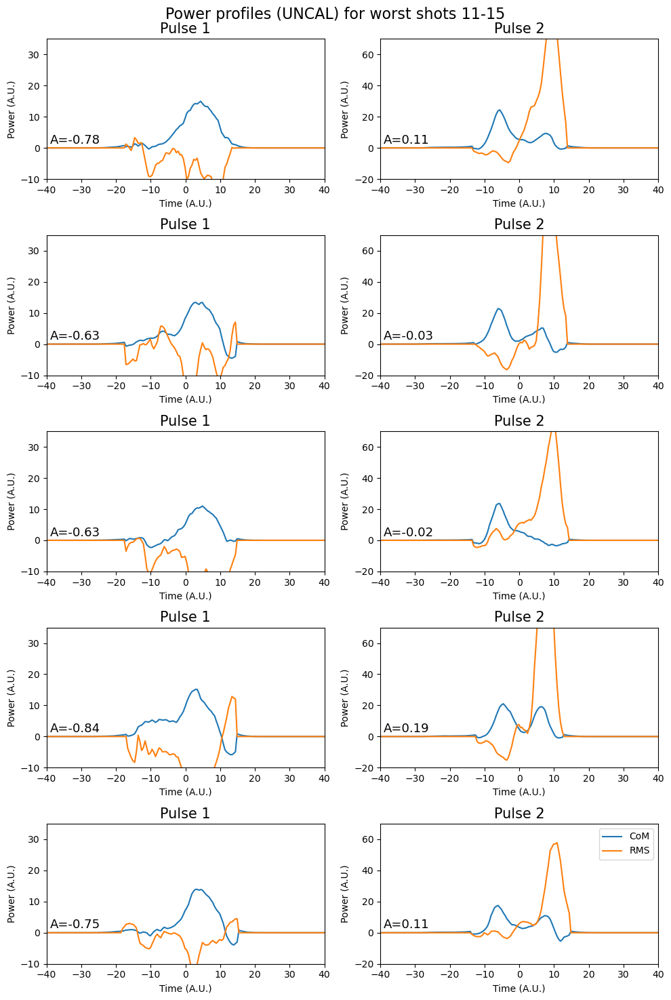

In [210]:
## WORST SHOTS

# Set shots
idx_first_shot = 10
n_shots_plot = 5
idces_shots_plot = np.arange(idx_first_shot,idx_first_shot+n_shots_plot)
shots_plot = inds_ordered[::-1][idces_shots_plot]


# Setup figure
fig,axs = plt.subplots(n_shots_plot,2,figsize=(10,3*n_shots_plot))

# Loop
for i,idx in enumerate(shots_plot):
    
    # Get reconstructions
    recon = xton.get_single_shot_power_profile(idx)
    
    # Get stats
    t = recon['t']
    powerECOM = recon['powerECOM']
    powerERMS = recon['powerERMS']
    agreement = recon['powerAgreement']

    # Get axes
    ax1,ax2 = axs[i]
    
    # Show
    ax1.plot(t,powerECOM[0],label='CoM')
    ax1.plot(t,powerERMS[0],label='RMS')
    ax2.plot(t,powerECOM[1],label='CoM')
    ax2.plot(t,powerERMS[1],label='RMS')
    ax1.set_xlim(-40,40)
    ax2.set_xlim(-40,40)
    ax1.set_ylim(-10,35)
    ax2.set_ylim(-20,70)
    ax1.set_title('Pulse 1',size=15)
    ax2.set_title('Pulse 2',size=15)
    ax1.set_xlabel('Time (A.U.)')
    ax2.set_xlabel('Time (A.U.)')
    ax1.set_ylabel('Power (A.U.)')
    ax2.set_ylabel('Power (A.U.)')
    # ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
    # ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
    ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
    ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)
    
plt.legend()
plt.suptitle(f'Power profiles (UNCAL) for worst shots {idx_first_shot+1}-{idx_first_shot+n_shots_plot}', size=16)
plt.tight_layout()
plt.show()

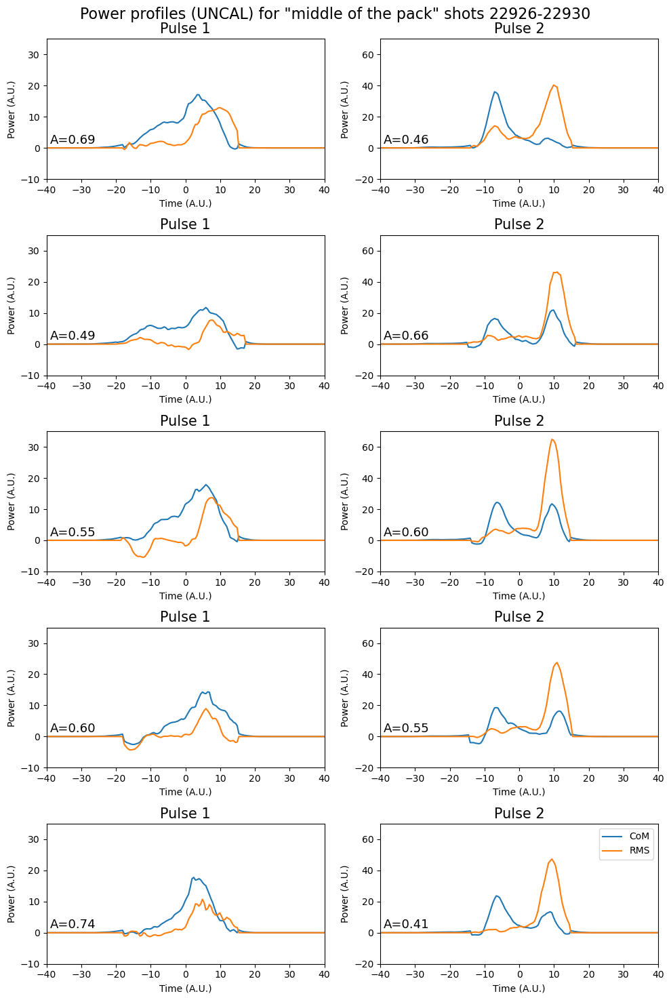

In [216]:
## Middle-of-the-pack shots

# Set shots
idx_first_shot = len(inds_ordered)//2 + 10
n_shots_plot = 5
idces_shots_plot = np.arange(idx_first_shot,idx_first_shot+n_shots_plot)
shots_plot = inds_ordered[::-1][idces_shots_plot]


# Setup figure
fig,axs = plt.subplots(n_shots_plot,2,figsize=(10,3*n_shots_plot))

# Loop
for i,idx in enumerate(shots_plot):
    
    # Get reconstructions
    recon = xton.get_single_shot_power_profile(idx)
    
    # Get stats
    t = recon['t']
    powerECOM = recon['powerECOM']
    powerERMS = recon['powerERMS']
    agreement = recon['powerAgreement']

    # Get axes
    ax1,ax2 = axs[i]
    
    # Show
    ax1.plot(t,powerECOM[0],label='CoM')
    ax1.plot(t,powerERMS[0],label='RMS')
    ax2.plot(t,powerECOM[1],label='CoM')
    ax2.plot(t,powerERMS[1],label='RMS')
    ax1.set_xlim(-40,40)
    ax2.set_xlim(-40,40)
    ax1.set_ylim(-10,35)
    ax2.set_ylim(-20,70)
    ax1.set_title('Pulse 1',size=15)
    ax2.set_title('Pulse 2',size=15)
    ax1.set_xlabel('Time (A.U.)')
    ax2.set_xlabel('Time (A.U.)')
    ax1.set_ylabel('Power (A.U.)')
    ax2.set_ylabel('Power (A.U.)')
    # ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
    # ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
    ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
    ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)
    
plt.legend()
plt.suptitle(f'Power profiles (UNCAL) for "middle of the pack" shots {idx_first_shot+1}-{idx_first_shot+n_shots_plot}', size=16)
plt.tight_layout()
plt.show()

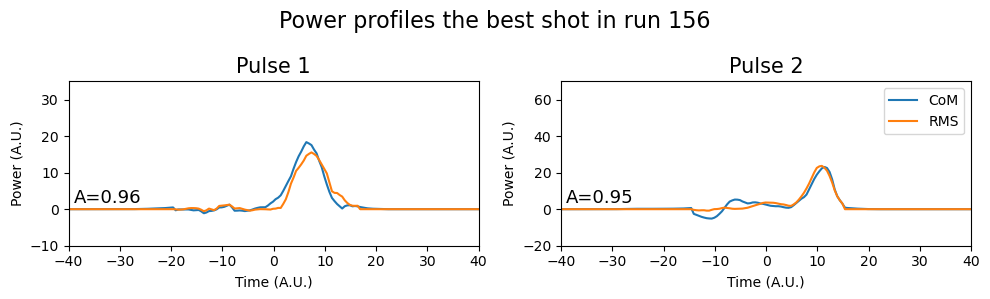

In [217]:
## SINGLE BEST SHOT

# Set shots
idx = inds_ordered[0]

# Get reconstruction & stats
recon = xton.get_single_shot_power_profile(idx)
t = recon['t']
powerECOM = recon['powerECOM']
powerERMS = recon['powerERMS']
agreement = recon['powerAgreement']

# Show
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
ax1.plot(t,powerECOM[0],label='CoM')
ax1.plot(t,powerERMS[0],label='RMS')
ax2.plot(t,powerECOM[1],label='CoM')
ax2.plot(t,powerERMS[1],label='RMS')
ax1.set_xlim(-40,40)
ax2.set_xlim(-40,40)
ax1.set_ylim(-10,35)
ax2.set_ylim(-20,70)
ax1.set_title('Pulse 1',size=15)
ax2.set_title('Pulse 2',size=15)
ax1.set_xlabel('Time (A.U.)')
ax2.set_xlabel('Time (A.U.)')
ax1.set_ylabel('Power (A.U.)')
ax2.set_ylabel('Power (A.U.)')
# ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
# ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)

plt.legend()
plt.suptitle(f'Power profiles the best shot in datarun 156', size=16)
plt.tight_layout()
plt.show()

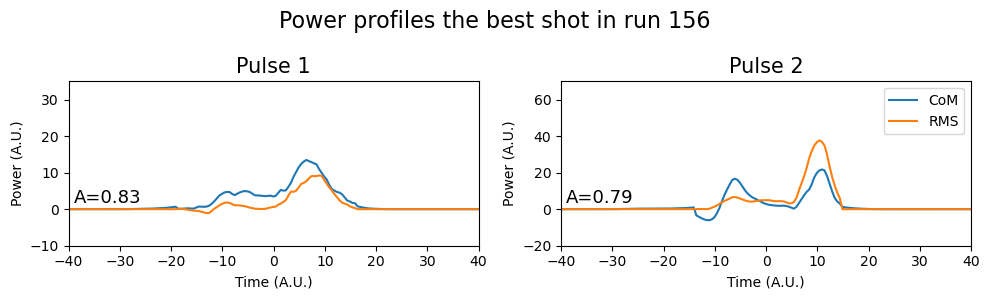

In [218]:
## SINGLE MIDDLE SHOT

# Set shots
idx = inds_ordered[2200]

# Get reconstruction & stats
recon = xton.get_single_shot_power_profile(idx)
t = recon['t']
powerECOM = recon['powerECOM']
powerERMS = recon['powerERMS']
agreement = recon['powerAgreement']

# Show
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
ax1.plot(t,powerECOM[0],label='CoM')
ax1.plot(t,powerERMS[0],label='RMS')
ax2.plot(t,powerECOM[1],label='CoM')
ax2.plot(t,powerERMS[1],label='RMS')
ax1.set_xlim(-40,40)
ax2.set_xlim(-40,40)
ax1.set_ylim(-10,35)
ax2.set_ylim(-20,70)
ax1.set_title('Pulse 1',size=15)
ax2.set_title('Pulse 2',size=15)
ax1.set_xlabel('Time (A.U.)')
ax2.set_xlabel('Time (A.U.)')
ax1.set_ylabel('Power (A.U.)')
ax2.set_ylabel('Power (A.U.)')
# ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
# ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)

plt.legend()
plt.suptitle(f'Power profiles the best shot in run 156', size=16)
plt.tight_layout()
plt.show()

In [39]:
inds_ordered = np.argsort(agreement_factor_means)[::-1]

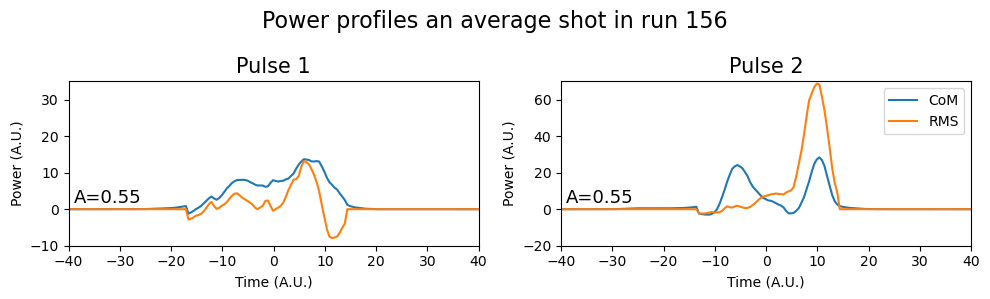

In [41]:
## SINGLE MIDDLE SHOT

# Set shots
idx = inds_ordered[2200]

# Get reconstruction & stats
recon = xton.get_single_shot_power_profile(idx)
t = recon['t']
powerECOM = recon['powerECOM']
powerERMS = recon['powerERMS']
agreement = recon['powerAgreement']

# Show
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(10,3))
ax1.plot(t,powerECOM[0],label='CoM')
ax1.plot(t,powerERMS[0],label='RMS')
ax2.plot(t,powerECOM[1],label='CoM')
ax2.plot(t,powerERMS[1],label='RMS')
ax1.set_xlim(-40,40)
ax2.set_xlim(-40,40)
ax1.set_ylim(-10,35)
ax2.set_ylim(-20,70)
ax1.set_title('Pulse 1',size=15)
ax2.set_title('Pulse 2',size=15)
ax1.set_xlabel('Time (A.U.)')
ax2.set_xlabel('Time (A.U.)')
ax1.set_ylabel('Power (A.U.)')
ax2.set_ylabel('Power (A.U.)')
# ax1.text(0.02,0.98,f'A={agreement[0]:.2f}',transform=ax1.transAxes,va='top',ha='left',size=13)
# ax2.text(0.02,0.98,f'A={agreement[1]:.2f}',transform=ax2.transAxes,va='top',ha='left',size=13)
ax1.text(-39,0.5,f'A={agreement[0]:.2f}',transform=ax1.transData,va='bottom',ha='left',size=13)
ax2.text(-39,1,f'A={agreement[1]:.2f}',transform=ax2.transData,va='bottom',ha='left',size=13)

plt.legend()
plt.suptitle(f'Power profiles an average shot in run 156', size=16)
plt.tight_layout()
plt.show()